In [1]:
# back to project root
%cd ~/research

import os
import numpy as np
import matplotlib.pyplot as plt
import cv2
import torch
from tqdm import tqdm
import sys
from glob import glob
import yaml

sys.path.append('src')
# from group.passing.dataset import make_all_data
from utility.logger import logger
from utility.activity_loader import load_individuals

/home/yokoyama/research


/home/yokoyama/research/.venv/lib/python3.8/site-packages/tqdm/auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


# Indivisual Activity をロード

In [101]:
cfg_path = "config/passing/pass_train.yaml"
with open(cfg_path, "r") as f:
    train_cfg = yaml.safe_load(f)
with open(train_cfg["config_path"]["individual"], "r") as f:
    ind_cfg = yaml.safe_load(f)
with open(train_cfg["config_path"]["group"], "r") as f:
    grp_cfg = yaml.safe_load(f)

In [3]:
data_dirs_all = {}
for room_num, surgery_items in train_cfg["dataset"]["setting"].items():
    for surgery_num in surgery_items.keys():
        dirs = sorted(glob(os.path.join("data", room_num, surgery_num, "passing", "*")))
        data_dirs_all[f"{room_num}_{surgery_num}"] = dirs

inds = {}
for key_prefix, dirs in tqdm(data_dirs_all.items()):
    for path in dirs:
        num = path.split("/")[-1]
        json_path = os.path.join(path, ".json", "individual.json")
        tmp_inds = load_individuals(json_path, ind_cfg)
        for pid, ind in tmp_inds.items():
            inds[f"{key_prefix}_{num}_{pid}"] = ind

100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:53<00:00,  8.96s/it]


# 特徴量抽出とデータ生成

In [104]:
import os
from logging import Logger
from types import SimpleNamespace
from typing import Any, Dict

import numpy as np
import torch
from individual.individual import Individual
from tqdm import tqdm
from utility import json_handler
from utility.functions import cos_similarity, gauss

def make_all_data(
    individuals: Dict[str, Individual],
    dataset_cfg: dict,
    passing_defs: dict,
    logger: Logger,
):
    x_dict: Dict[str, Any] = {}
    y_dict: Dict[str, Any] = {}
    data_all = _make_time_series_from_cfg(dataset_cfg, logger)
    for room_num, room_data in data_all.items():
        for surgery_num, surgery_data in room_data.items():
            logger.info(f"=> extracting feature {room_num}_{surgery_num}")
            for data_num, time_series in tqdm(surgery_data.items()):
                keys = []
                for pair_key, row in time_series.items():
                    id1, id2 = pair_key.split("_")
                    feature_que: list = []
                    for (frame_num, is_pass) in row:
                        ind1 = individuals[f"{room_num}_{surgery_num}_{data_num}_{id1}"]
                        ind2 = individuals[f"{room_num}_{surgery_num}_{data_num}_{id2}"]

                        # extract feature
                        feature_que = extract_feature(
                            ind1,
                            ind2,
                            feature_que,
                            frame_num,
                            passing_defs,
                            with_padding=False,
                        )

                        # save data
                        key = f"{room_num}_{surgery_num}_{data_num}_{pair_key}"
                        if key not in x_dict:
                            keys.append(key)
                            x_dict[key] = []
                            y_dict[key] = []

                        if len(feature_que) > 0:
                            x_dict[key].append(feature_que[-1])
                            y_dict[key].append(is_pass)
                            
                # delete long distance data
                # ToDo
                for key in keys:
                    distance = np.array(x_dict[key])[:, 4]
                    mean = np.mean(distance)
                    if (mean > passing_defs["dist_mu"] + passing_defs["dist_sig"] * 3 and
                        1 not in y_dict[key]):
                        del x_dict[key]
                        del y_dict[key]

    return x_dict, y_dict


def _make_time_series_from_cfg(dataset_cfg: dict, logger: Logger):
    ret_data = {}
    for room_num, room_cfg in dataset_cfg.items():
        room_data = {}
        for surgery_num, surgery_cfg in room_cfg.items():
            logger.info(f"=> createing time series {room_num}_{surgery_num}")
            surgery_data = {}
            for data_num, row in tqdm(surgery_cfg.items()):
                settings = []
                for item in row:
                    settings.append(
                        {
                            "id1": item[0],
                            "id2": item[1],
                            "begin": int(item[2]),
                            "end": int(item[3]),
                        }
                    )

                kps_json_path = os.path.join(
                    "data",
                    room_num,
                    surgery_num,
                    "passing",
                    data_num,
                    ".json",
                    "keypoints.json",
                )
                kps_data = json_handler.load(kps_json_path)

                max_frame = kps_data[-1]["frame"]
                time_series: Dict[str, list] = {}
                for frame_num in range(1, max_frame + 1):
                    frame_data = [
                        data for data in kps_data if data["frame"] == frame_num
                    ]

                    for i in range(len(frame_data) - 1):
                        for j in range(i + 1, len(frame_data)):
                            [id1, id2] = sorted(
                                [frame_data[i]["id"], frame_data[j]["id"]]
                            )

                            pair_key = f"{id1}_{id2}"
                            if pair_key not in time_series:
                                time_series[pair_key] = []

                            is_pass = 0
                            for item in settings:
                                if (id1 == item["id1"] and id2 == item["id2"]) or (
                                    id1 == item["id2"] and id2 == item["id1"]
                                ):
                                    if (
                                        item["begin"] <= frame_num
                                        and frame_num <= item["end"]
                                    ):
                                        is_pass = 1
                                        break

                            time_series[pair_key].append((frame_num, is_pass))

                surgery_data[data_num] = time_series
            room_data[surgery_num] = surgery_data
        ret_data[room_num] = room_data
    return ret_data


def _get_indicators(ind: Individual, frame_num: int):
    pos = ind.get_indicator("position", frame_num)
    body = ind.get_indicator("body", frame_num)
    arm = ind.get_indicator("arm", frame_num)
    wrist = (
        ind.get_keypoints("LWrist", frame_num),
        ind.get_keypoints("RWrist", frame_num),
    )
    ret = {"pos": pos, "body": body, "arm": arm, "wrist": wrist}
    return ret


def extract_feature(
    ind1: Individual,
    ind2: Individual,
    que: list,
    frame_num: int,
    defs: dict,
    with_padding: bool = True,
):
    # get indicator
    ind1_data = _get_indicators(ind1, frame_num)
    ind2_data = _get_indicators(ind2, frame_num)

    # if not (None in ind1_data.values() or None in ind2_data.values()):
    ind1_data = SimpleNamespace(**ind1_data)
    ind2_data = SimpleNamespace(**ind2_data)

    # calc distance of position
    p1_pos = np.array(ind1_data.pos)
    p2_pos = np.array(ind2_data.pos)

    norm = np.linalg.norm(p1_pos - p2_pos, ord=2)
    distance = gauss(norm, mu=defs["dist_mu"], sigma=defs["dist_sig"])

    p1p2 = p2_pos - p1_pos
    p2p1 = p1_pos - p2_pos

    p1p2_sim = cos_similarity(ind1_data.body, p1p2)
    p2p1_sim = cos_similarity(ind2_data.body, p2p1)
    body_direction = (np.average([p1p2_sim, p2p1_sim]) + 1) / 2

    # calc arm average
    arm_ave = np.average([ind1_data.arm, ind2_data.arm])

    # calc wrist distance
    wrist_norm = np.inf
    for i in range(2):
        for j in range(2):
            tmp_norm = np.linalg.norm(
                np.array(ind1_data.wrist[i]) - np.array(ind2_data.wrist[j]), ord=2
            )
            wrist_norm = min(wrist_norm, float(tmp_norm))

    wrist_distance = gauss(wrist_norm, mu=defs["wrist_mu"], sigma=defs["wrist_sig"])

    # concatnate to feature
    feature = [distance, body_direction, arm_ave, wrist_distance, norm, wrist_norm]
    que.append(feature)

    if len(que) < defs["seq_len"]:
        # 0 padding
        if with_padding:
            return que + [[0, 0, 0, 0] for _ in range(defs["seq_len"] - len(que))]
        else:
            return que
    else:
        return que[-defs["seq_len"] :]

In [105]:
# create model
x_dict, y_dict = make_all_data(inds, train_cfg["dataset"]["setting"], grp_cfg["passing"]["default"], logger)

2022-08-20 19:53:13,037 => createing time series 02_001
100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 17/17 [00:01<00:00,  9.71it/s]
2022-08-20 19:53:14,790 => createing time series 07_001
100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 48/48 [00:18<00:00,  2.64it/s]
2022-08-20 19:53:32,957 => createing time series 08_001
100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 38/38 [00:03<00:00,  9.59it/s]
2022-08-20 19:53:36,922 => createing time series 08_002
100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 45/45 [00:19<00:00,  2.26it/s]
2022-08-20 19:53:56,865 => c

In [38]:
for room_num, surgery_items in train_cfg["dataset"]["setting"].items():
    print(room_num)
    
    y_lst_all = []
    for key, y_lst in y_dict.items():
        if key[:2] == room_num:
            y_lst_all += y_lst

    len_pass = len([i for i in y_lst_all if i == 1])
    len_not_pass = len([i for i in y_lst_all if i == 0])

    print(f'all length:{len(y_lst_all)}')
    print(f'passing: {len_pass}')
    print(f'not passing: {len_not_pass}')
    
print('total')
y_lst_all = []
for key, y_lst in y_dict.items():
    y_lst_all += y_lst

len_pass = len([i for i in y_lst_all if i == 1])
len_not_pass = len([i for i in y_lst_all if i == 0])

print(f'all length:{len(y_lst_all)}')
print(f'passing: {len_pass}')
print(f'not passing: {len_not_pass}')

02
all length:136397
passing: 583
not passing: 135814
07
all length:527354
passing: 2265
not passing: 525089
08
all length:700400
passing: 3805
not passing: 696595
09
all length:463892
passing: 1102
not passing: 462790
total
all length:1828043
passing: 7755
not passing: 1820288


In [39]:
# setting random seed
np.random.seed(train_cfg["dataset"]["random_seed"])
keys_1 = [key for key in x_dict if 1 in y_dict[key]]
keys_0 = [key for key in x_dict if 1 not in y_dict[key]]
random_keys_1 = np.random.choice(
    keys_1,
    size=len(keys_1),
    replace=False
)
random_keys_0 = np.random.choice(
    keys_0,
    size=len(keys_0),
    replace=False
)

train_ratio = train_cfg["dataset"]["train_ratio"]
train_len_1 = int(len(keys_1) * train_ratio)
train_len_0 = int(len(keys_0) * train_ratio)

train_keys_1 = random_keys_1[:train_len_1].tolist()
test_keys_1 = random_keys_1[train_len_1:].tolist()
train_keys_0 = random_keys_0[:train_len_0].tolist()
test_keys_0 = random_keys_0[train_len_0:].tolist()

train_keys = train_keys_1 + train_keys_0
test_keys = test_keys_1 + test_keys_0

x_train_dict = {key: x_dict[key] for key in train_keys}
y_train_dict = {key: y_dict[key] for key in train_keys}

x_test_dict = {key: x_dict[key] for key in test_keys}
y_test_dict = {key: y_dict[key] for key in test_keys}

In [40]:
train_1 = {key: y_dict[key] for key in train_keys if 1 in y_dict[key]}
print(len(train_1))
train_0 = {key: y_dict[key] for key in train_keys if 0 in y_dict[key]}
print(len(train_0))

train_1_frame = 0
train_0_frame = 0
for data in y_train_dict.values():
    train_1_frame += len([val for val in data if val == 1])
    train_0_frame += len([val for val in data if val == 0])
    
print(train_1_frame)
print(train_0_frame)

139
10075
6612
1462961


In [41]:
test_1 = {key: y_dict[key] for key in test_keys if 1 in y_dict[key]}
print(len(test_1))
test_0 = {key: y_dict[key] for key in test_keys if 0 in y_dict[key]}
print(len(test_0))

test_1_frame = 0
test_0_frame = 0
for data in y_test_dict.values():
    test_1_frame += len([val for val in data if val == 1])
    test_0_frame += len([val for val in data if val == 0])
print(test_1_frame)
print(test_0_frame)

35
2520
1143
357327


# 分布

In [107]:
def extract_feature(x_dict, y_dict, col_num, is_pass):
    hist = {}
    for room_num, surgery_items in train_cfg["dataset"]["setting"].items():
        for _ in surgery_items.keys():
            hist_room = []
            for key, x_lst, y_lst in zip(x_dict.keys(), x_dict.values(), y_dict.values()):
                x_lst = np.array(x_lst)
                if room_num in key and is_pass in y_lst:
                    hist_room += x_lst.T[col_num].tolist()
            hist[room_num] = hist_room
        
    return hist

## 受け渡し動作中の距離の分布を見る

In [108]:
hist_dist_raw_1 = extract_feature(
    x_dict,
    y_dict,
    4,
    1
)

160.9402252764714
62.77832367301759
1357.5109575985014
349.2751962955242


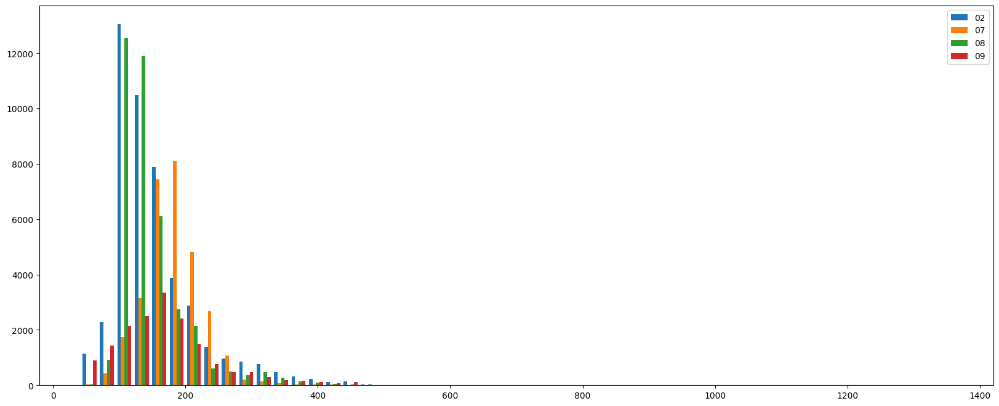

In [109]:
data = []
for vals in hist_dist_raw_1.values():
    for val in vals:
        # if val < 2000:
        data.append(val)
max_dist_raw = np.max(data)
print(np.mean(data))
print(np.std(data))
print(np.max(data))
print(np.mean(data) + np.std(data) * 3)

plt.figure(figsize=(20, 8))
plt.hist(hist_dist_raw_1.values(), bins=50, label=list(hist_dist_raw_1.keys()))
# plt.vlines(np.mean(data), 0, 1000)
plt.legend()

In [110]:
hist_dist_raw_0 = extract_feature(
    x_dict,
    y_dict,
    4,
    0
)

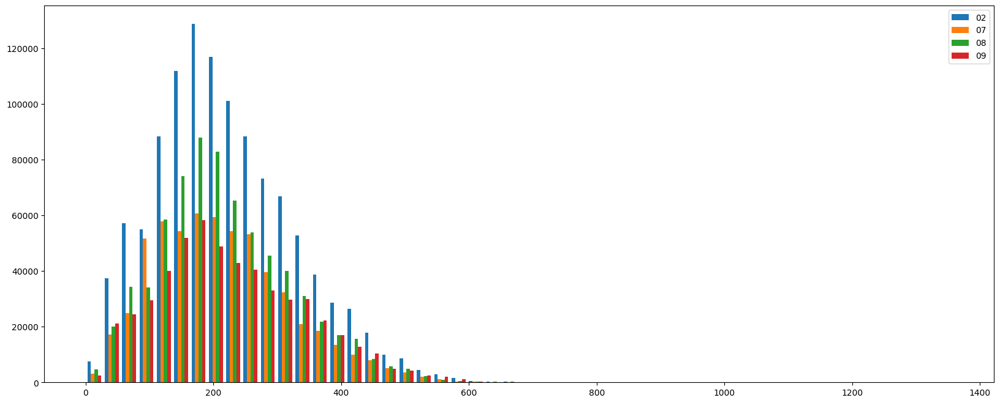

In [111]:
plt.figure(figsize=(20, 8))
plt.hist(hist_dist_raw_0.values(), bins=50, range=(0, max_dist_raw), label=list(hist_dist_raw_0.keys()))
plt.legend()

In [112]:
data = []
for vals in hist_dist_raw_1.values():
    for val in vals:
        data.append(val)
for vals in hist_dist_raw_0.values():
    for val in vals:
        data.append(val)
print(np.mean(data))
print(np.std(data))

217.880129312258
108.47918126035277


In [92]:
hist_dist_1 = extract_feature(
    x_dict,
    y_dict,
    0,
    1
)

0.7950278305450877
0.1601439963696376


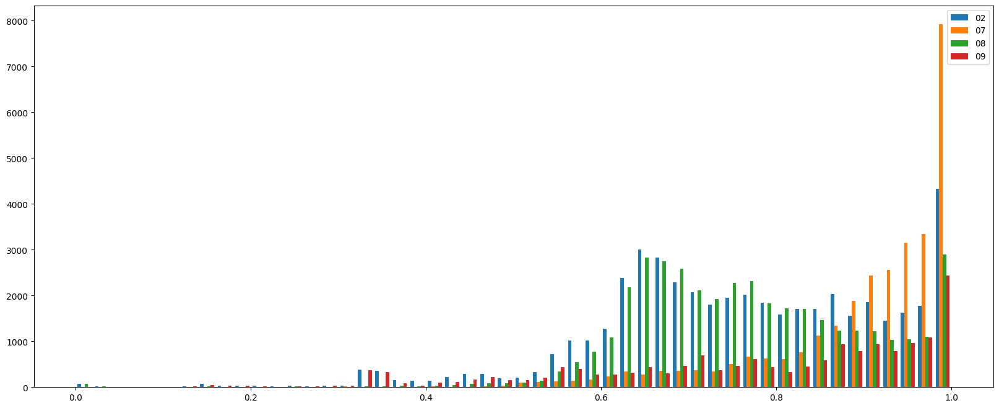

In [93]:
data = []
for vals in hist_dist_1.values():
    for val in vals:
        # if val < 2000:
        data.append(val)
print(np.mean(data))
print(np.std(data))

plt.figure(figsize=(20, 8))
plt.hist(hist_dist_1.values(), bins=50, range=(0, 1), label=list(hist_dist_1.keys()))
# plt.vlines(np.mean(data), 0, 1000)
plt.legend()

In [94]:
hist_dist_0 = extract_feature(
    x_dict,
    y_dict,
    0,
    0
)

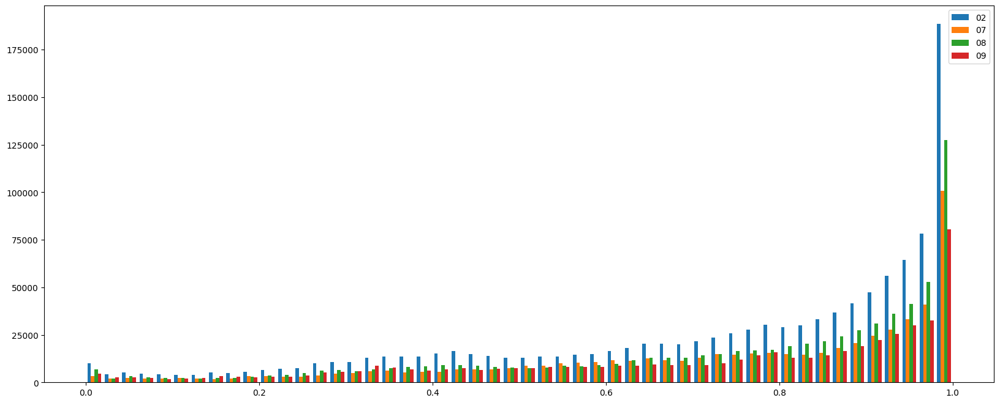

In [95]:
plt.figure(figsize=(20, 8))
plt.hist(hist_dist_0.values(), bins=50, range=(0, 1), label=list(hist_dist_0.keys()))
plt.legend()

## 受け渡し動作中の体の向きの分布を見る

In [51]:
hist_body_1 = extract_feature(
    x_dict,
    y_dict,
    1,
    1
)

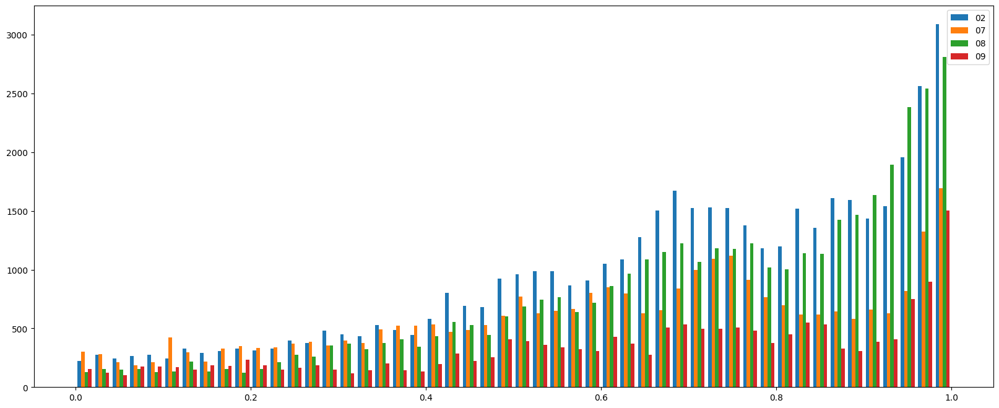

In [52]:
plt.figure(figsize=(20, 8))
plt.hist(hist_body_1.values(), bins=50, range=(0, 1), label=list(hist_body_1.keys()))
plt.legend()

In [53]:
hist_body_0 = extract_feature(
    x_dict,
    y_dict,
    1,
    0
)

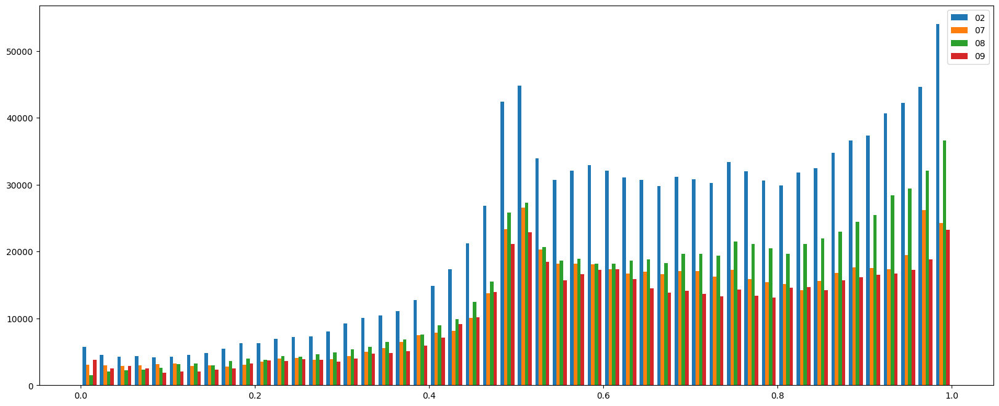

In [54]:
plt.figure(figsize=(20, 8))
plt.hist(hist_body_0.values(), bins=50, range=(0, 1), label=list(hist_body_0.keys()))
plt.legend()

## 受け渡し動作中の腕の上げ下げの分布を見る

In [55]:
hist_arm_1 = extract_feature(
    x_dict,
    y_dict,
    2,
    1
)

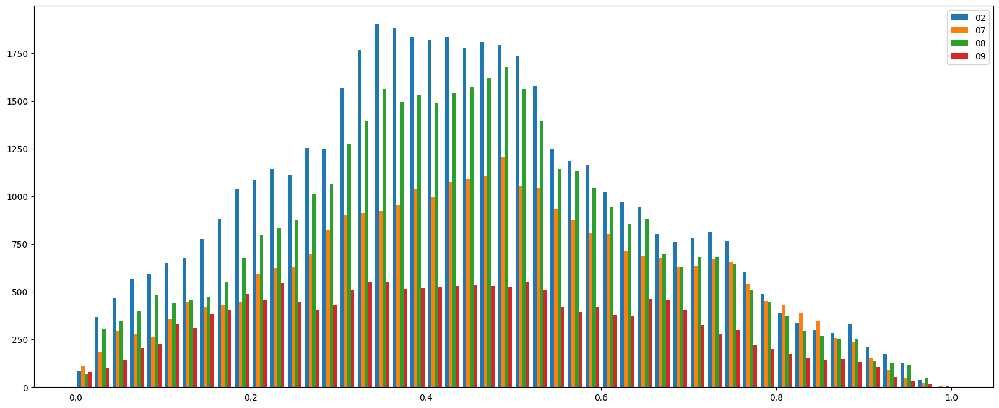

In [56]:
plt.figure(figsize=(20, 8))
plt.hist(hist_arm_1.values(), bins=50, range=(0, 1), label=list(hist_arm_1.keys()))
plt.legend()

In [57]:
hist_arm_0 = extract_feature(
    x_dict,
    y_dict,
    2,
    0
)

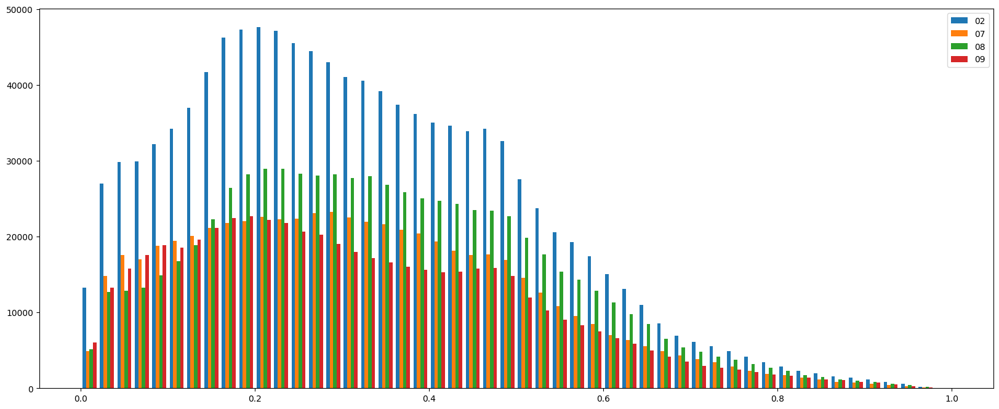

In [58]:
plt.figure(figsize=(20, 8))
plt.hist(hist_arm_0.values(), bins=50, range=(0, 1), label=list(hist_arm_0.keys()))
plt.legend()

## 受け渡し動作中の手首の距離の分布を見る

In [77]:
hist_wrist_raw_1 = extract_feature(
    x_dict,
    y_dict,
    5,
    1
)

284.31813581964695
151.28113265744705
938.2689289741726
738.1615337919881


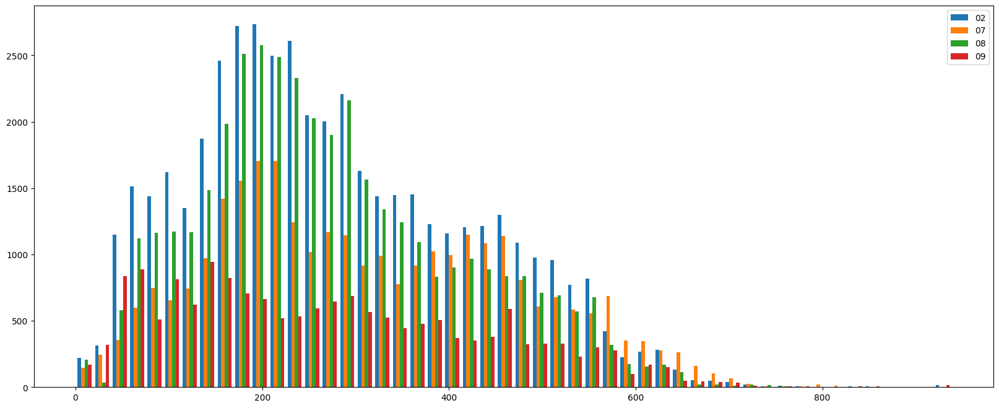

In [83]:
data = []
for vals in hist_wrist_raw_1.values():
    for val in vals:
        # if val < 2000:
        data.append(val)
max_wrist_raw = np.max(data)
print(np.mean(data))
print(np.std(data))
print(np.max(data))
print(np.mean(data) + np.std(data) * 3)

plt.figure(figsize=(20, 8))
plt.hist(hist_wrist_raw_1.values(), bins=50, label=list(hist_wrist_raw_1.keys()))
# plt.vlines(np.mean(data), 0, 1000)
plt.legend()

In [79]:
hist_wrist_raw_0 = extract_feature(
    x_dict,
    y_dict,
    5,
    0
)

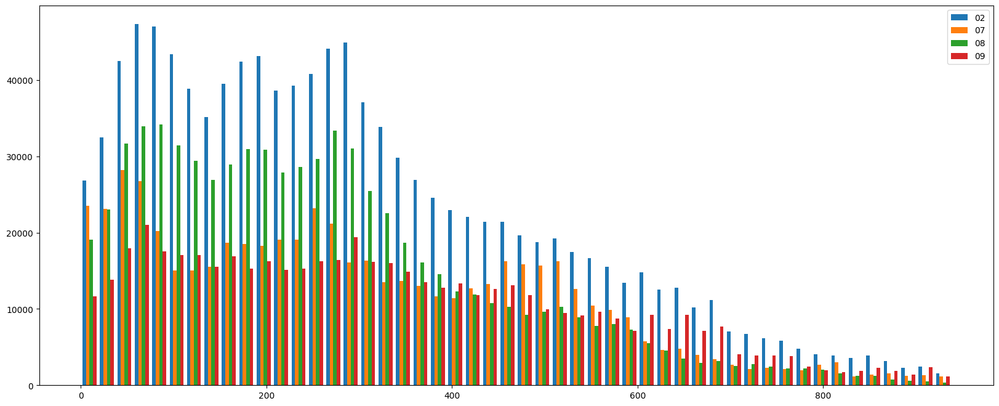

In [84]:
plt.figure(figsize=(20, 8))
plt.hist(hist_wrist_raw_0.values(), bins=50, range=(0, max_wrist_raw), label=list(hist_wrist_raw_0.keys()))
plt.legend()

In [87]:
data = []
for vals in hist_wrist_raw_1.values():
    for val in vals:
        data.append(val)
for vals in hist_wrist_raw_0.values():
    for val in vals:
        data.append(val)
print(np.mean(data))
print(np.std(data))

302.10503075624945
213.0055684497577


In [96]:
hist_wrist_1 = extract_feature(
    x_dict,
    y_dict,
    3,
    1
)

0.8026339658642468
0.18449129869476247


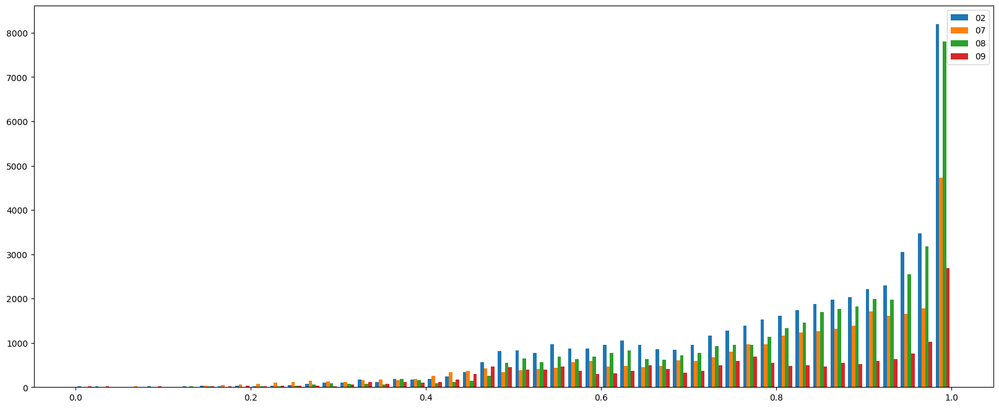

In [97]:
data = []
for vals in hist_wrist_1.values():
    for val in vals:
        # if val < 2000:
        data.append(val)
print(np.mean(data))
print(np.std(data))

plt.figure(figsize=(20, 8))
plt.hist(hist_wrist_1.values(), bins=50, range=(0, 1), label=list(hist_wrist_1.keys()))
plt.legend()

In [98]:
hist_wrist_0 = extract_feature(
    x_dict,
    y_dict,
    3,
    0
)

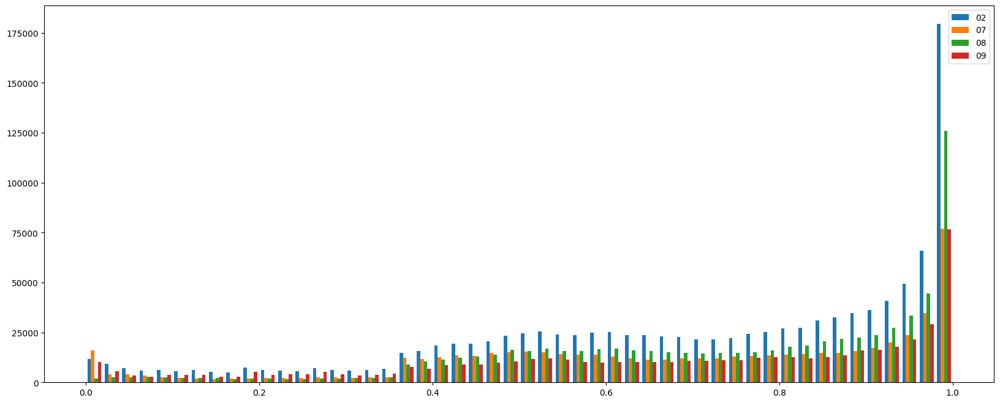

In [99]:
plt.figure(figsize=(20, 8))
plt.hist(hist_wrist_0.values(), bins=50, range=(0, 1), label=list(hist_wrist_0.keys()))
plt.legend()

# 時系列でプロット

02_001_02_1_3


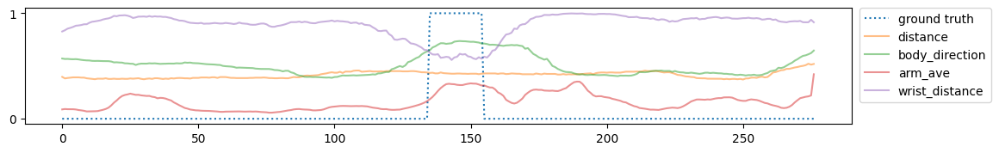

02_001_02_1_4


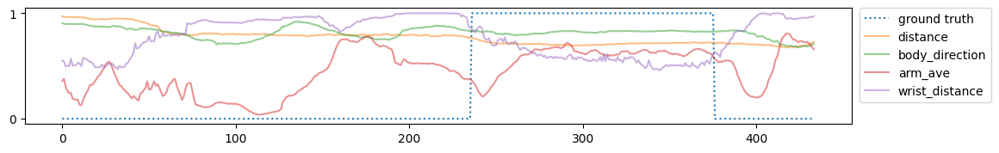

02_001_03_4_5


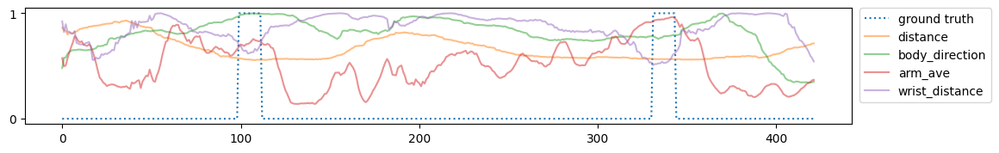

02_001_04_5_25


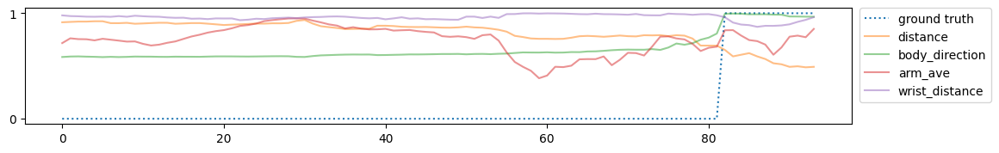

02_001_05_23_32


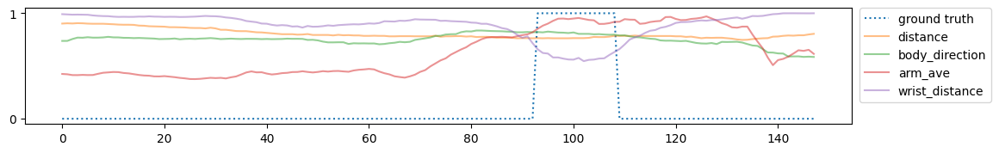

02_001_06_24_39


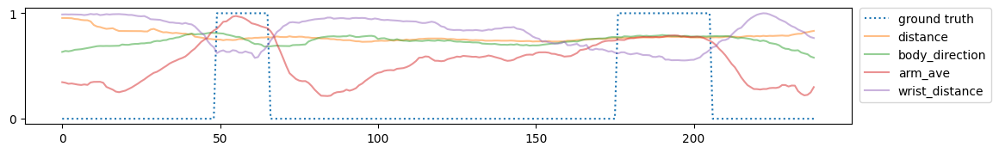

02_001_08_23_39


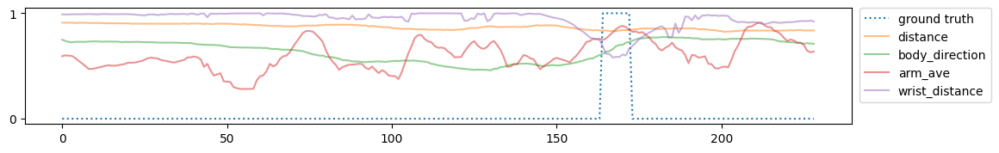

02_001_09_39_51


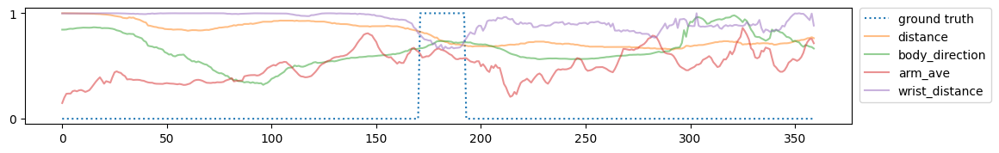

02_001_10_39_67


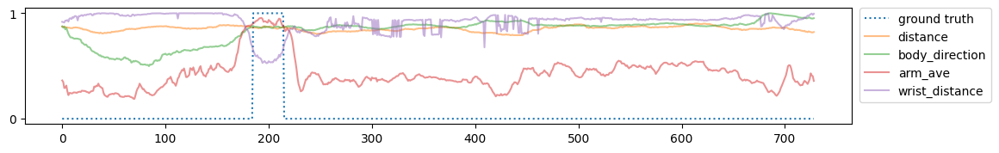

02_001_11_63_71


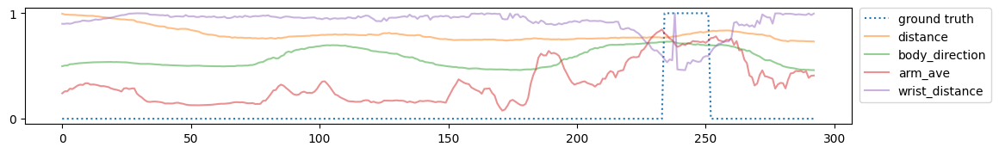

02_001_15_94_96


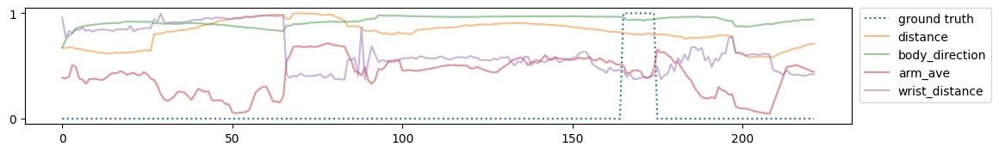

02_001_18_38_94


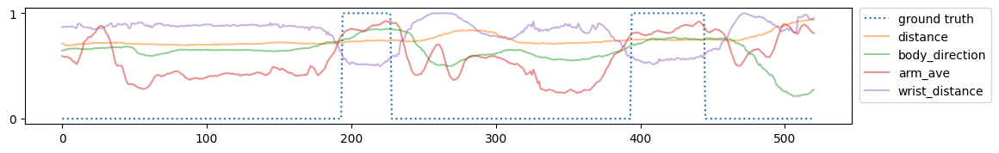

02_001_19_38_94


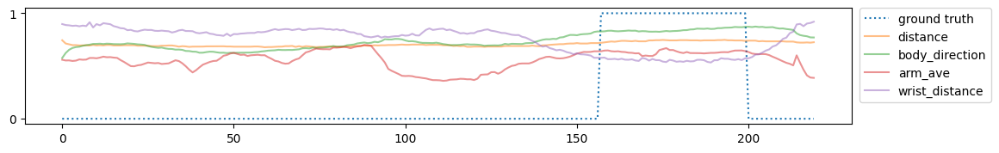

02_001_20_38_138


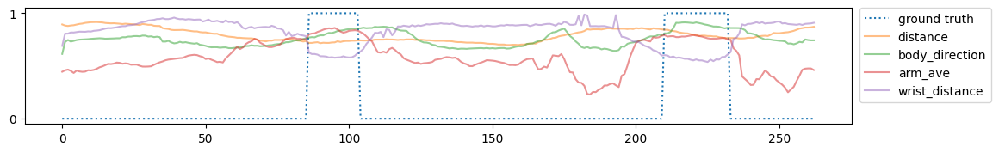

02_001_21_38_152


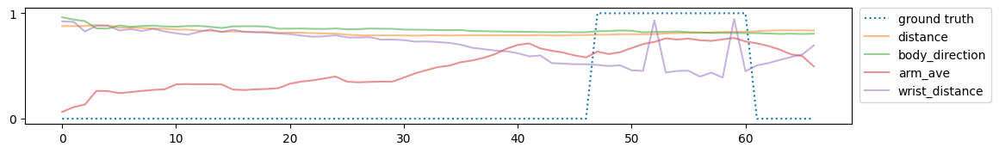

02_001_22_150_152


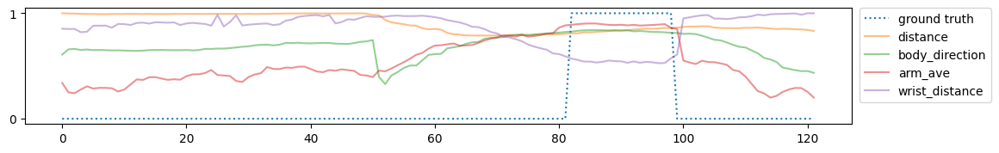

02_001_23_38_168


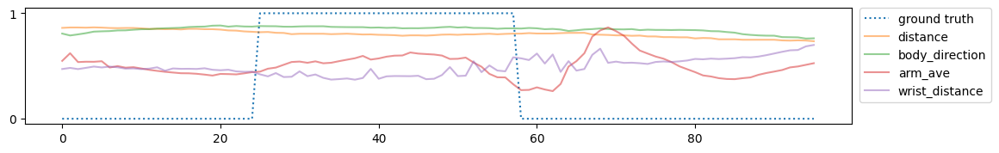

07_001_02_6_11


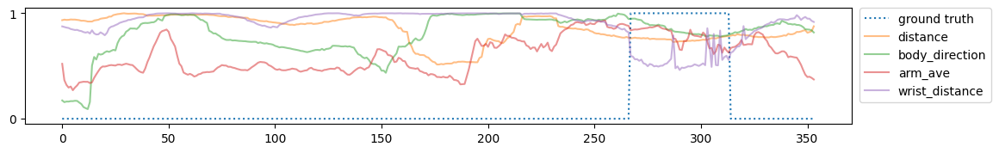

07_001_03_19_24


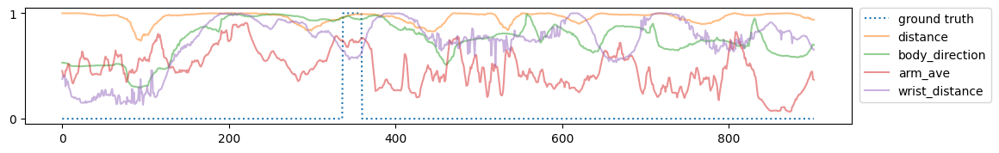

07_001_04_41_49


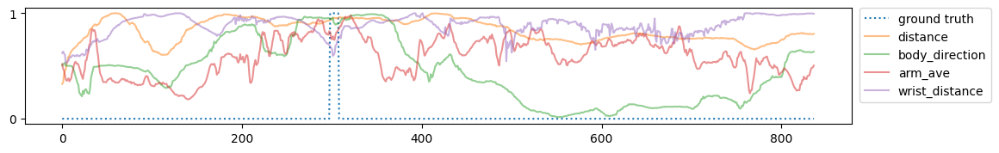

07_001_05_45_70


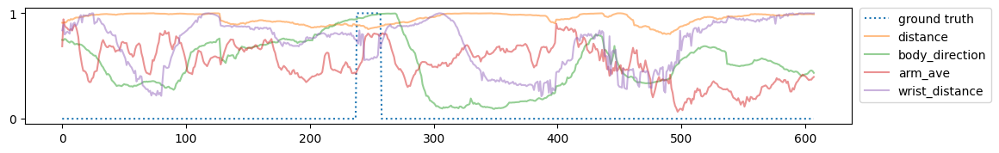

07_001_06_75_89


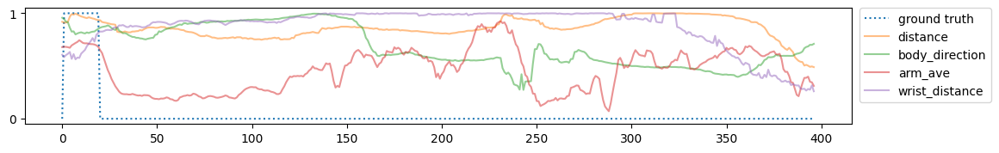

07_001_07_107_112


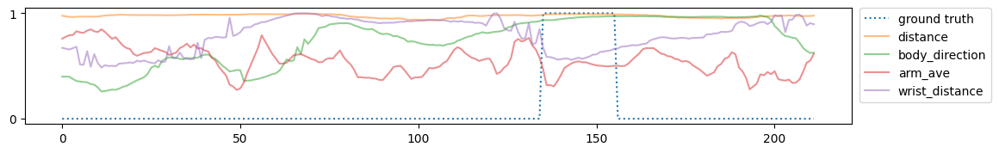

07_001_09_45_135


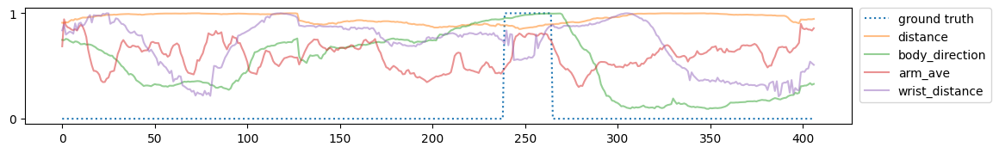

07_001_10_135_144


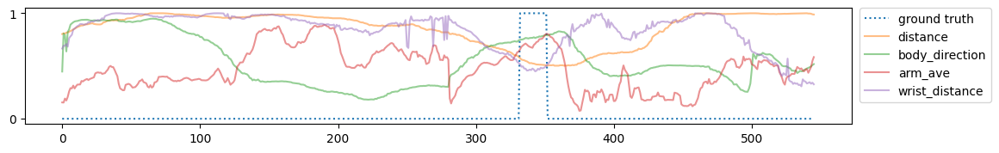

07_001_11_135_144


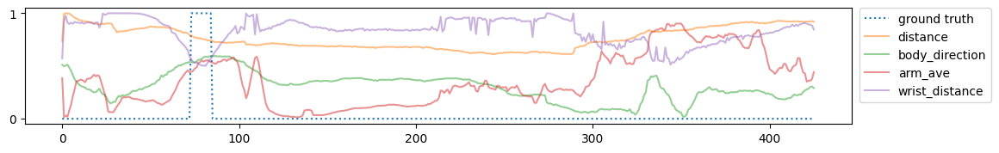

07_001_12_168_172


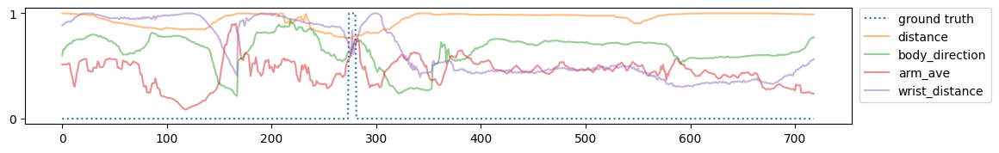

07_001_13_194_196


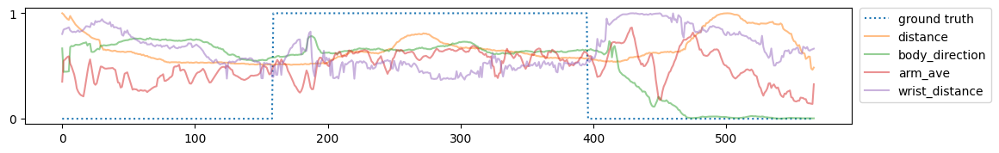

07_001_14_207_209


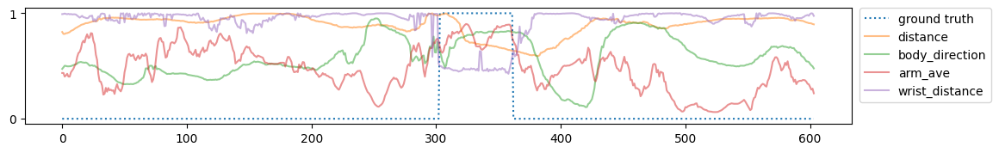

07_001_15_209_224


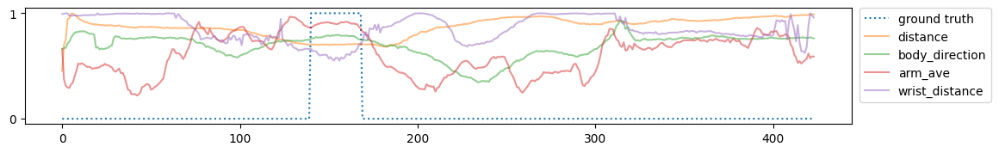

07_001_16_229_244


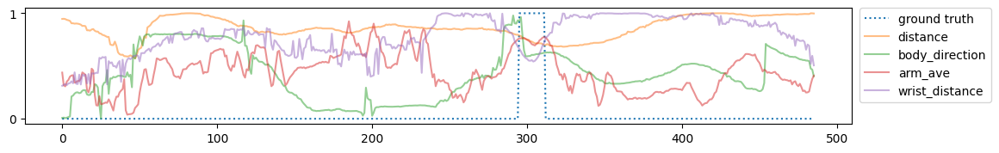

07_001_17_242_262


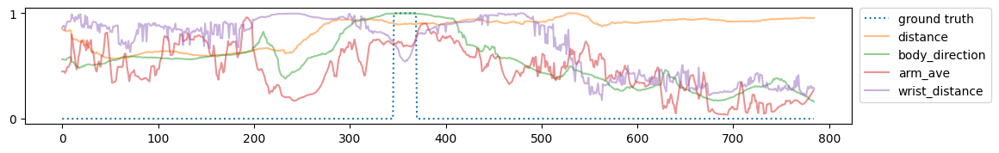

07_001_18_270_274


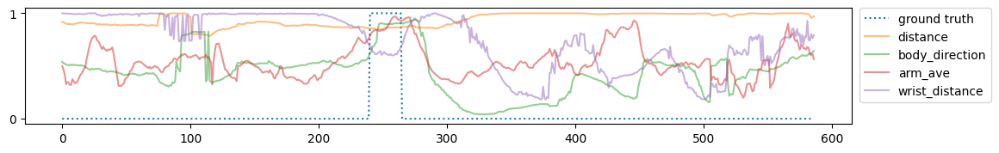

07_001_19_281_285


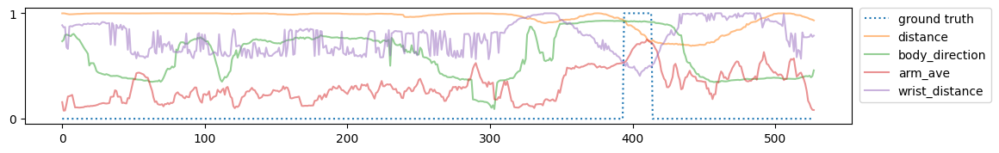

07_001_20_281_310


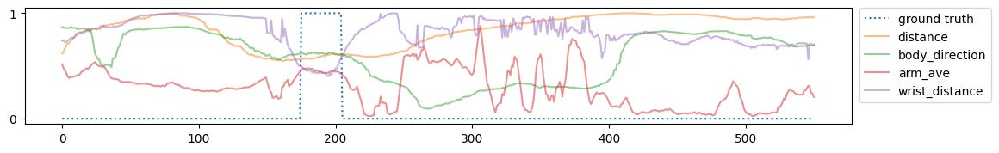

07_001_21_274_294


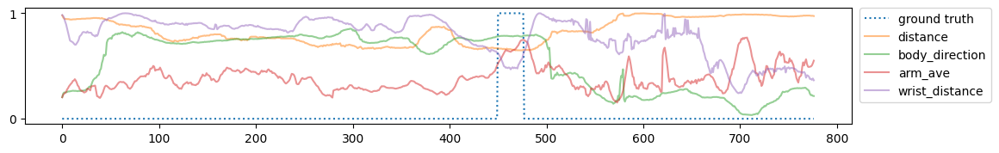

07_001_22_274_333


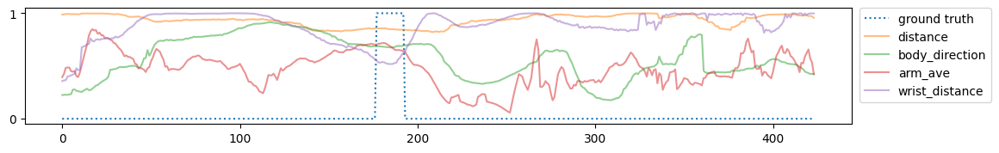

07_001_23_333_344


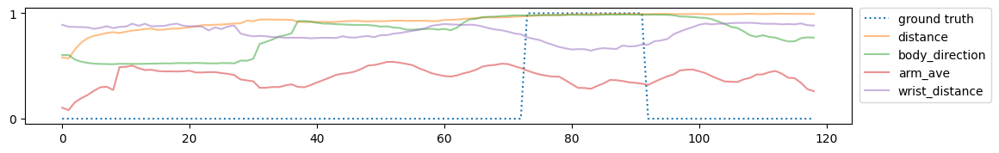

07_001_24_347_352


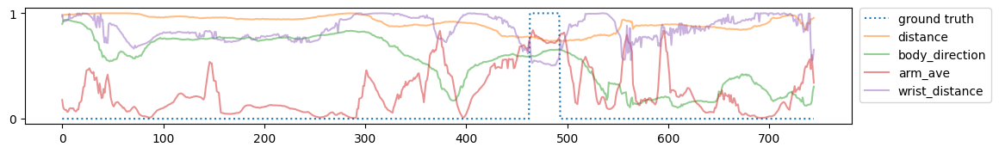

07_001_25_369_378


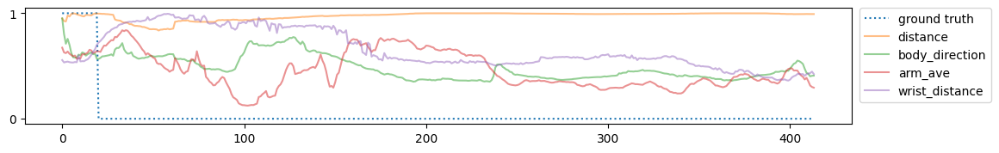

07_001_26_381_382


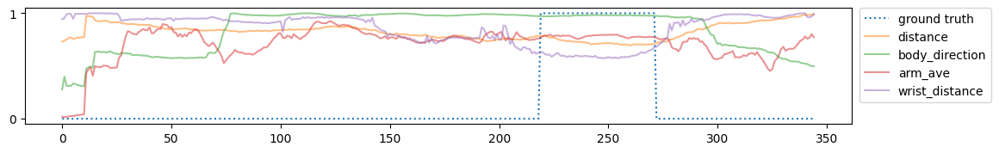

07_001_26_382_392


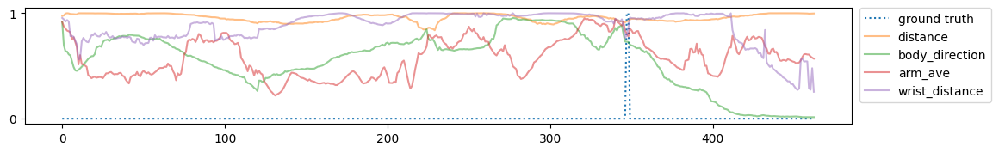

07_001_27_382_392


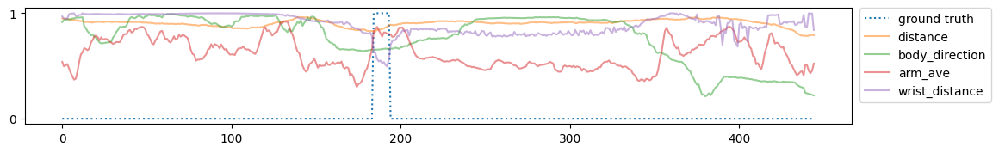

07_001_28_402_406


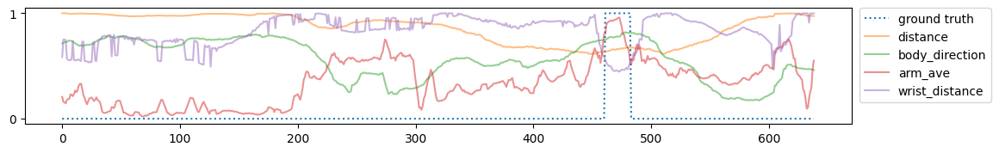

07_001_29_413_430


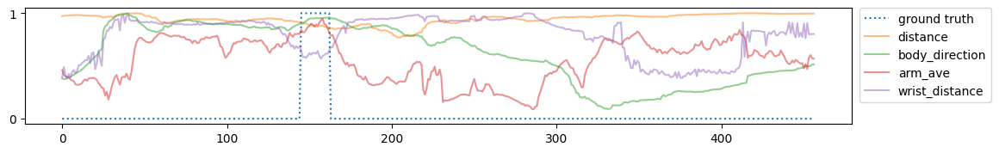

07_001_30_430_436


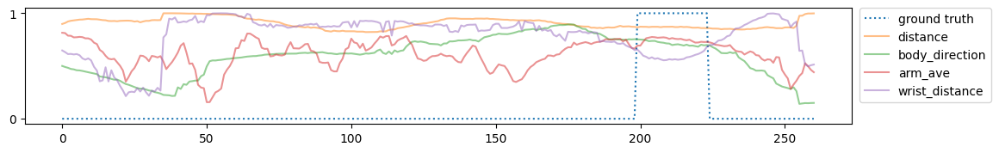

07_001_31_438_453


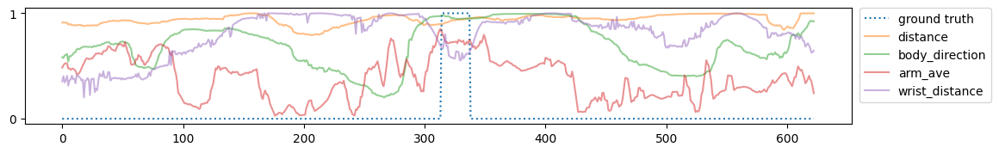

07_001_32_466_468


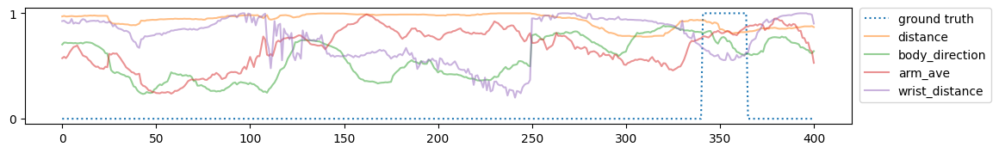

07_001_33_466_483


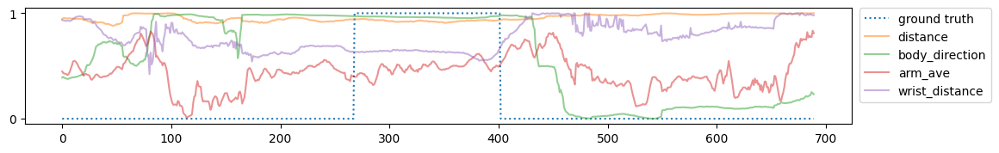

07_001_34_482_483


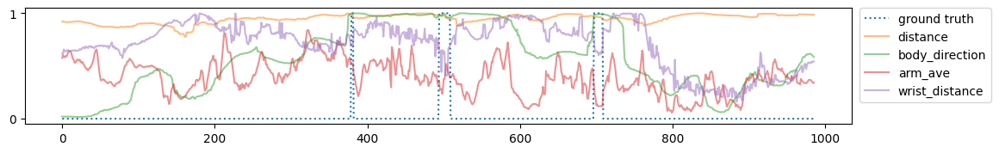

07_001_35_482_483


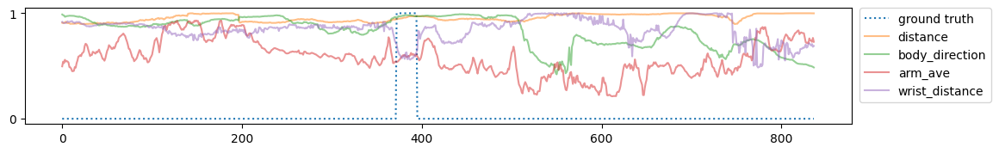

07_001_36_482_520


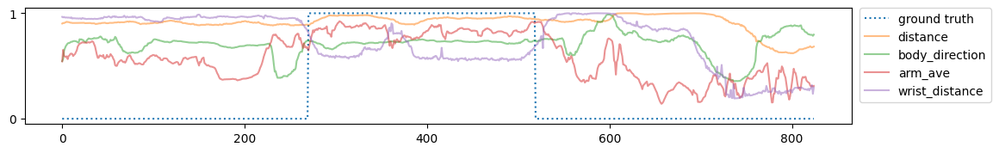

07_001_37_520_542


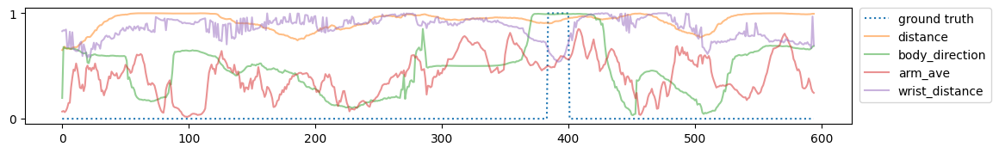

07_001_38_520_565


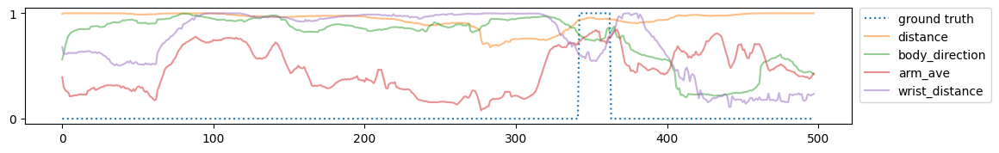

07_001_39_520_565


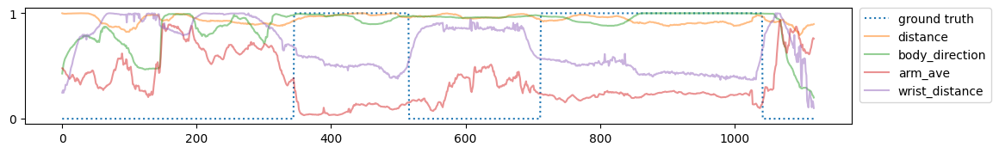

07_001_40_520_565


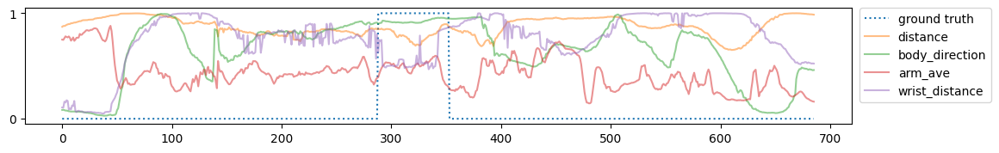

07_001_41_565_594


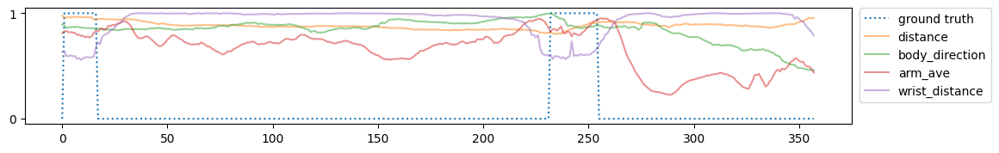

07_001_43_609_610


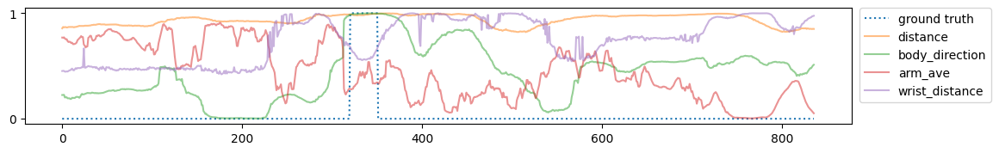

07_001_44_609_610


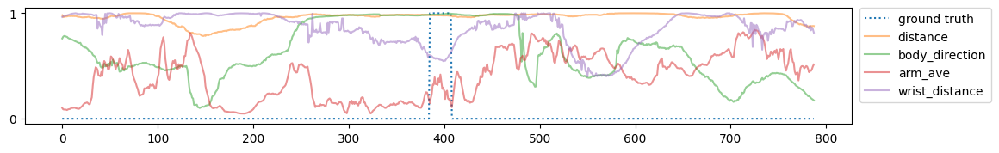

07_001_45_610_629


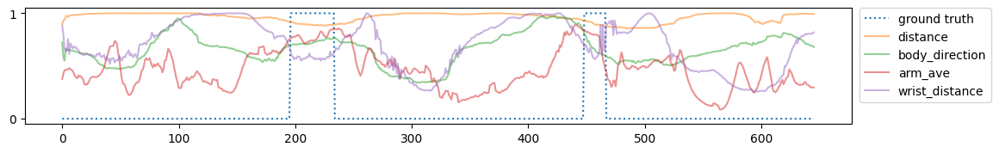

07_001_46_628_629


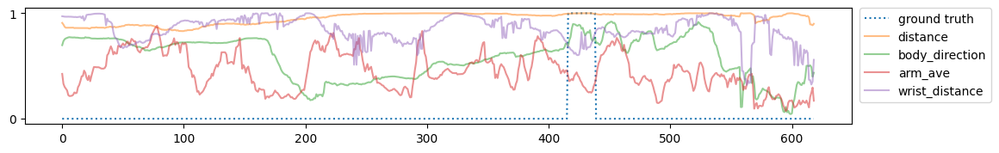

07_001_47_640_646


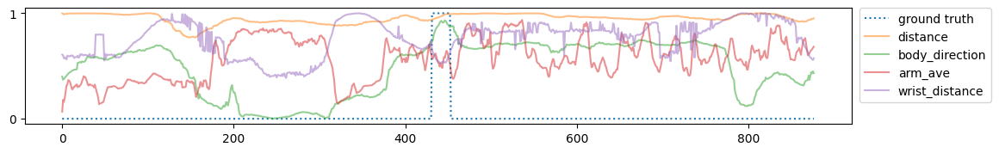

07_001_48_640_649


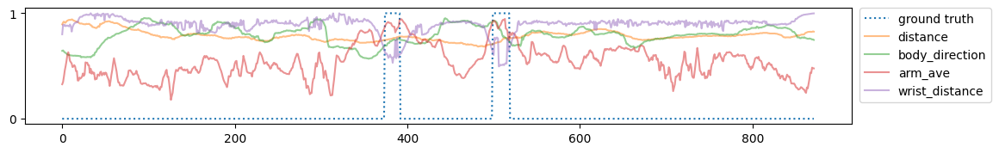

07_001_49_640_649


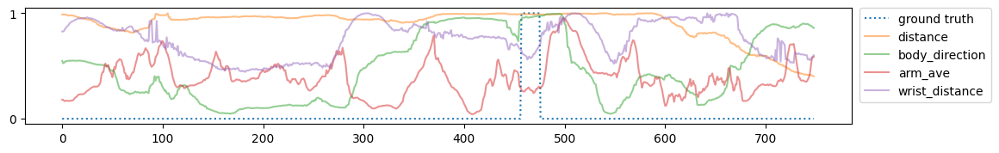

07_001_50_649_661


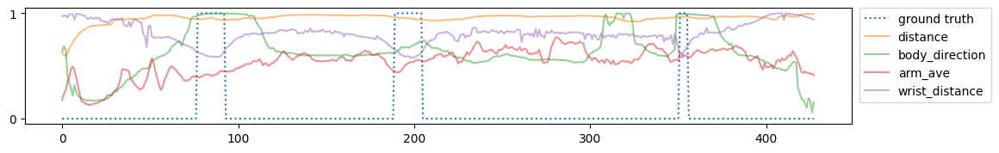

08_001_01_1_8


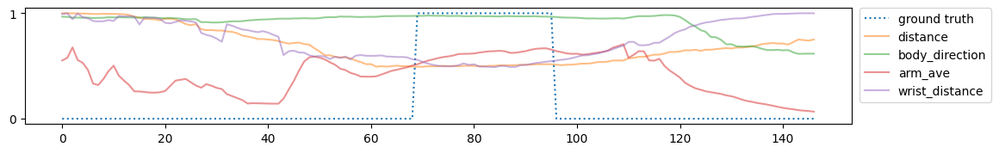

08_001_03_1_15


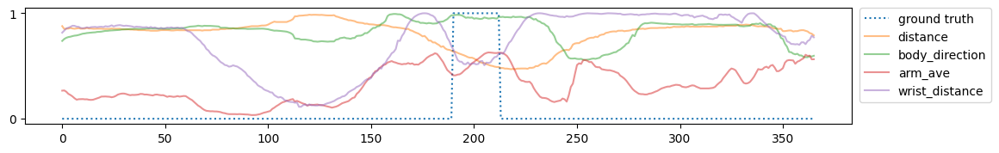

08_001_05_1_29


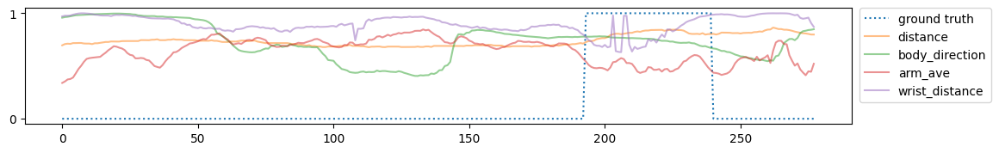

08_001_06_35_36


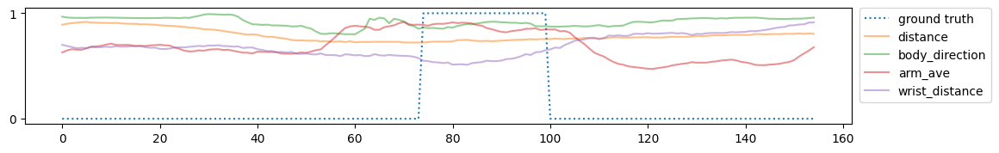

08_001_07_29_39


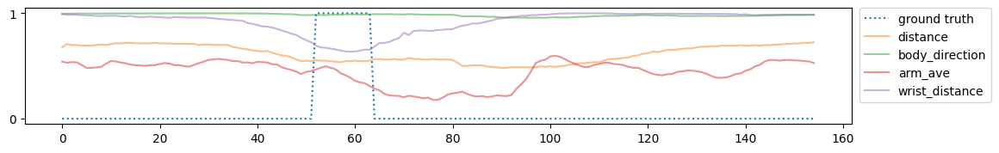

08_001_08_34_43


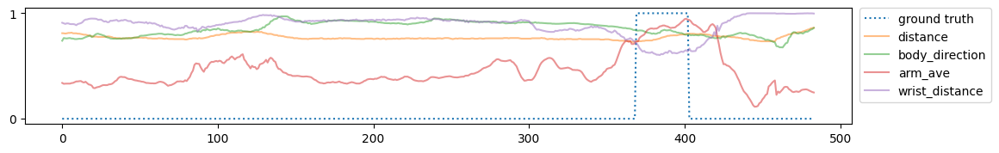

08_001_09_43_51


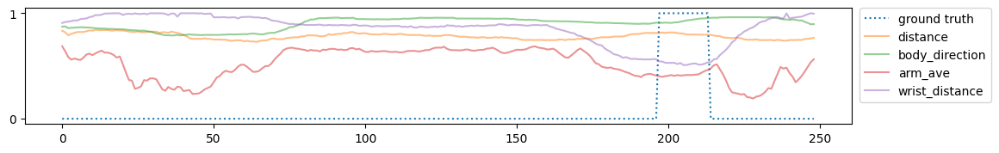

08_001_10_43_51


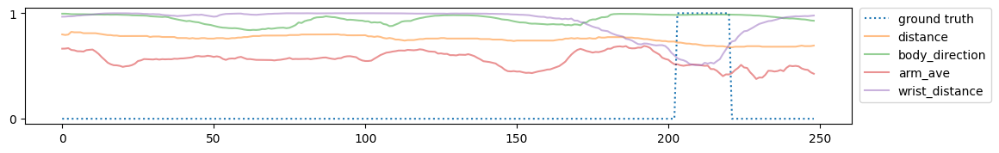

08_001_11_43_51


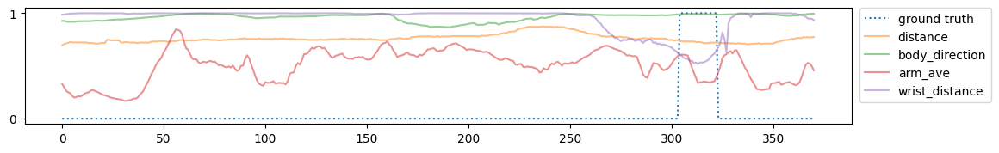

08_001_12_43_68


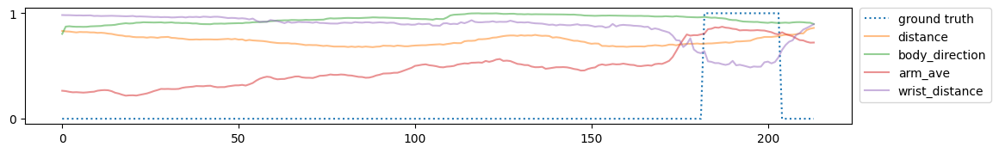

08_001_13_43_68


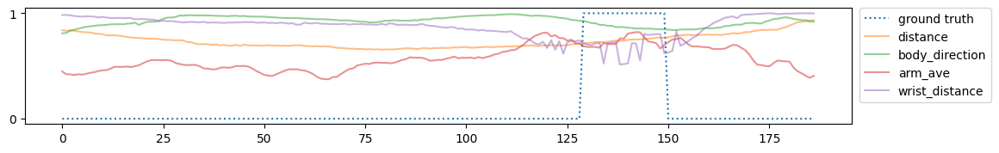

08_001_15_43_77


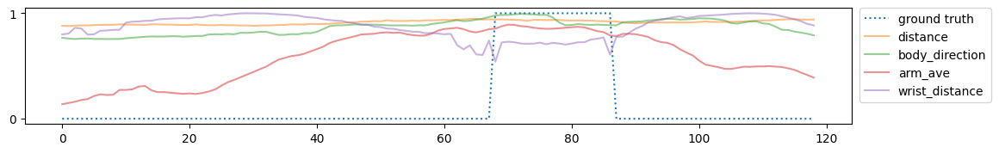

08_001_16_43_97


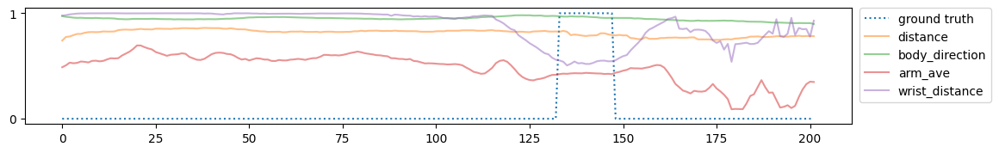

08_001_17_97_100


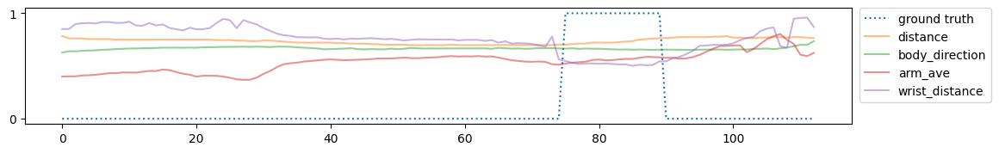

08_001_18_89_103


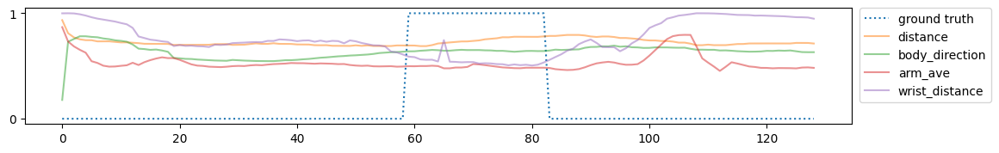

08_001_19_43_103


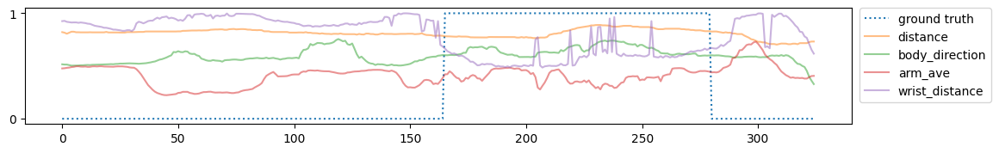

08_001_21_103_111


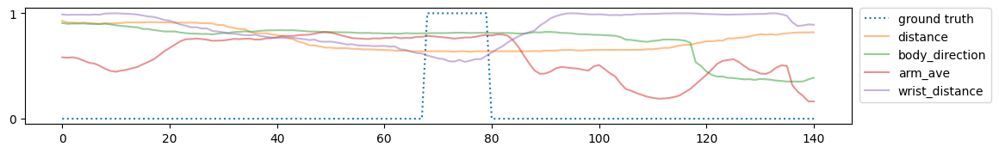

08_001_23_112_120


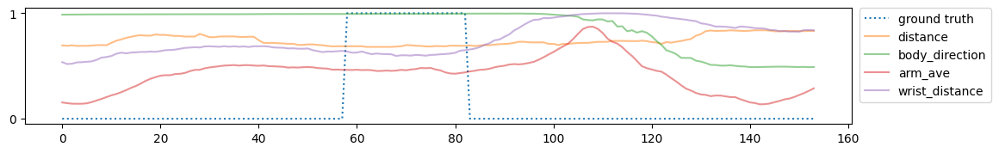

08_001_24_111_112


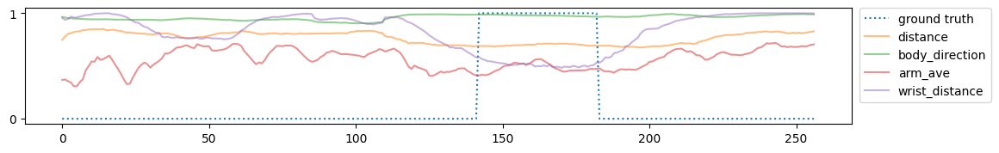

08_001_25_111_134


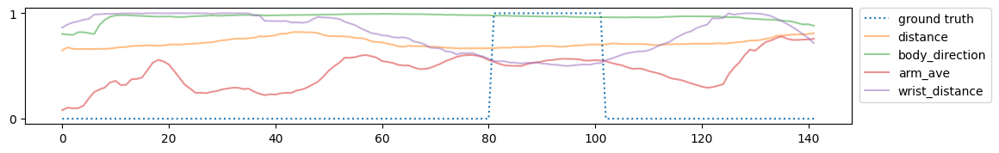

08_001_26_111_141


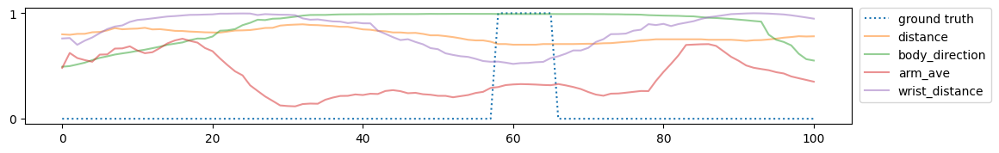

08_001_27_111_145


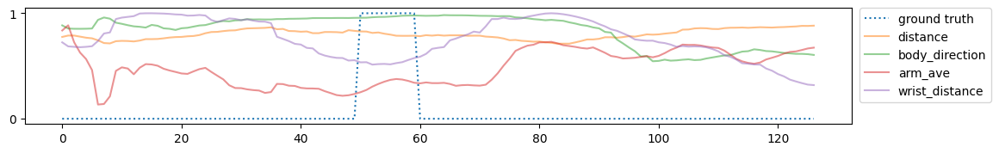

08_001_29_145_151


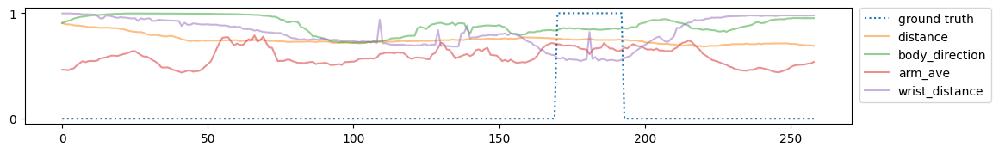

08_001_30_151_157


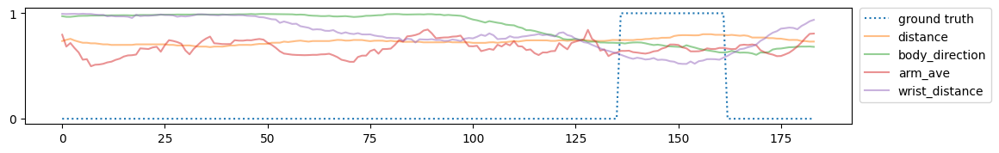

08_001_31_151_168


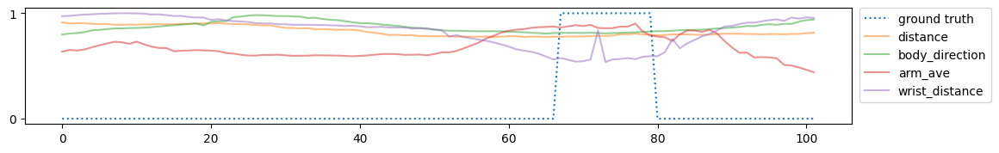

08_001_32_167_172


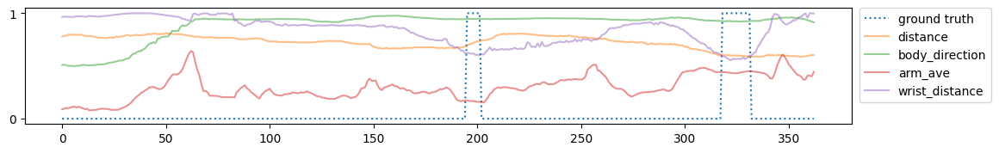

08_001_33_167_172


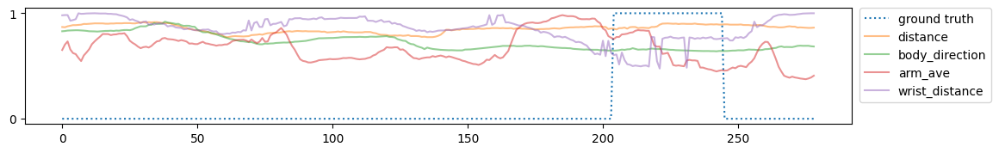

08_001_34_158_172


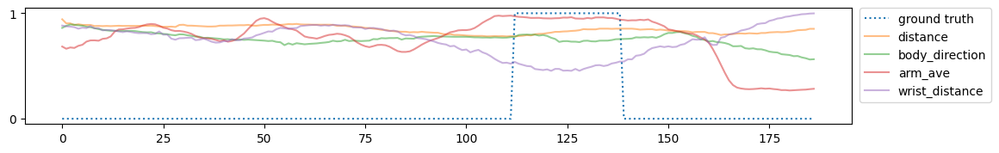

08_001_35_158_172


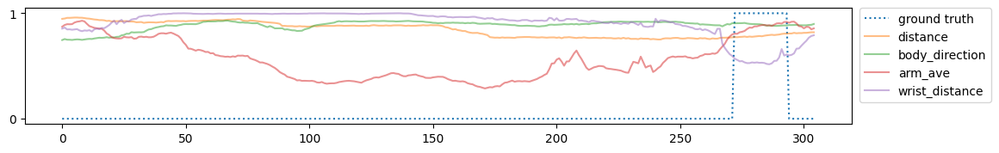

08_001_36_158_183


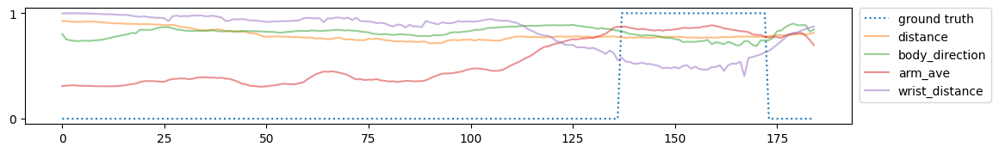

08_001_37_158_172


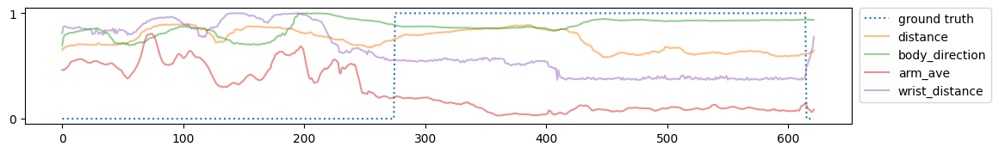

08_001_38_158_172


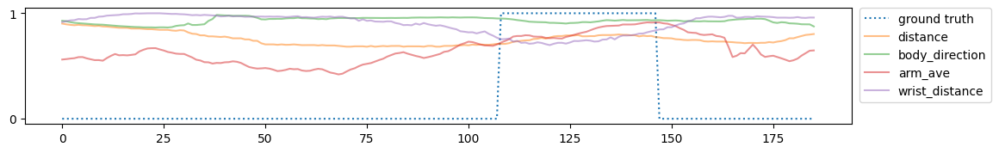

08_001_39_158_203


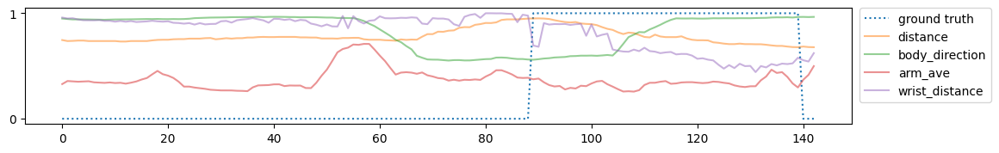

08_001_40_203_210


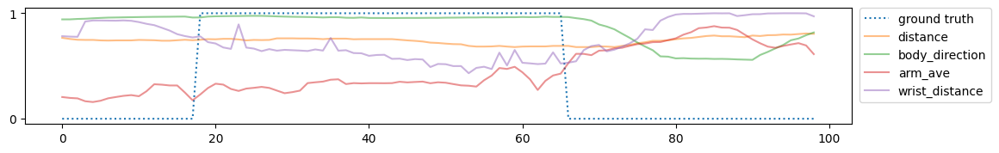

08_001_41_205_213


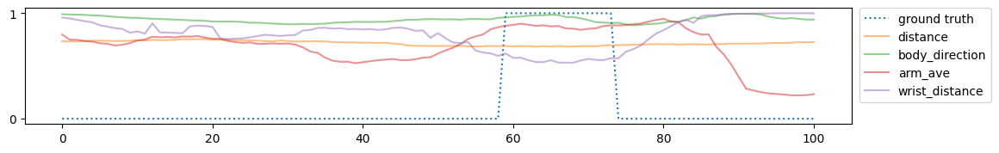

08_002_01_7_10


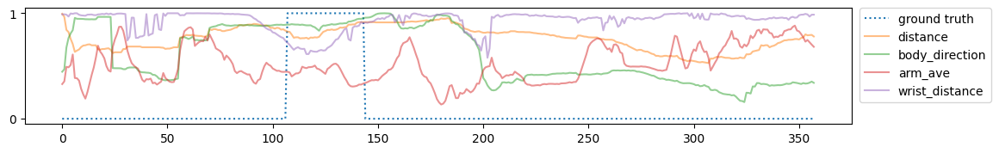

08_002_02_10_30


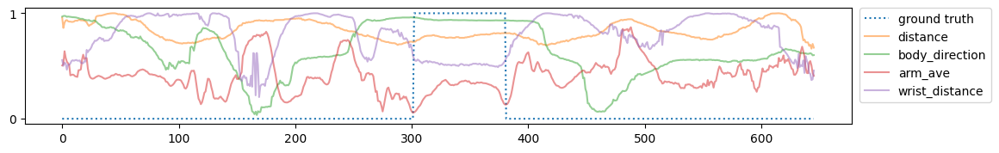

08_002_03_37_41


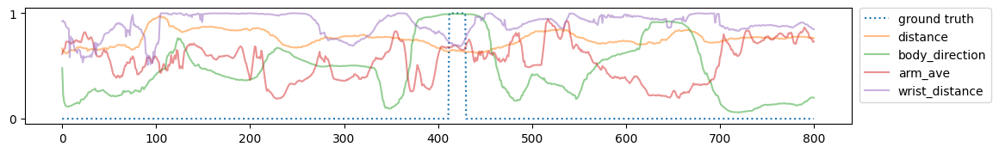

08_002_04_50_52


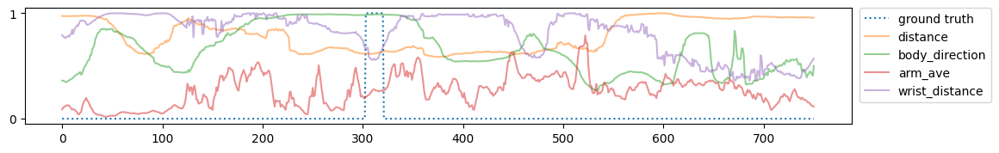

08_002_05_52_61


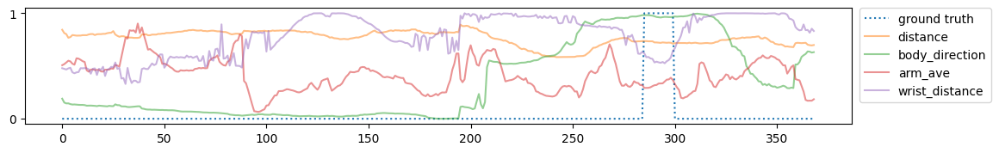

08_002_06_71_72


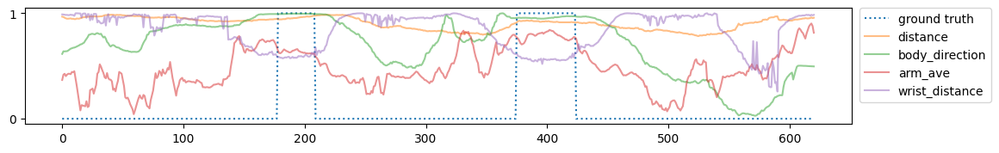

08_002_07_72_85


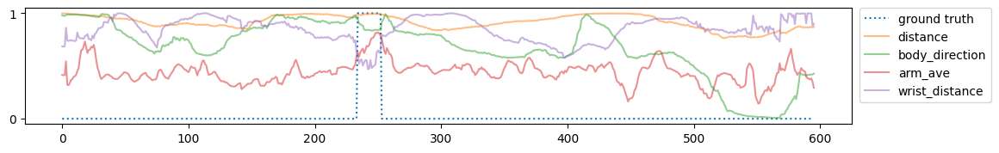

08_002_08_72_98


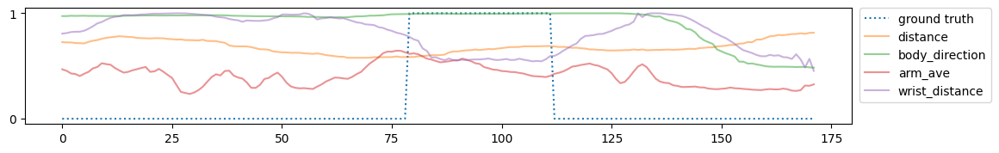

08_002_09_72_102


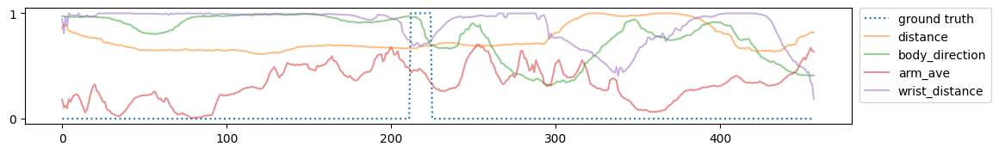

08_002_09_72_106


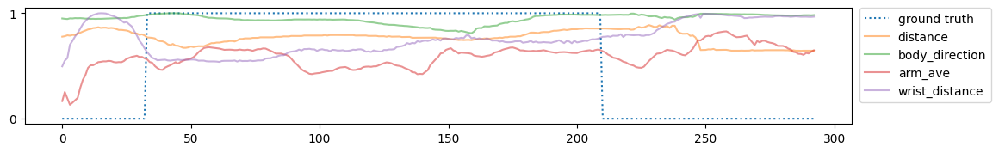

08_002_10_72_110


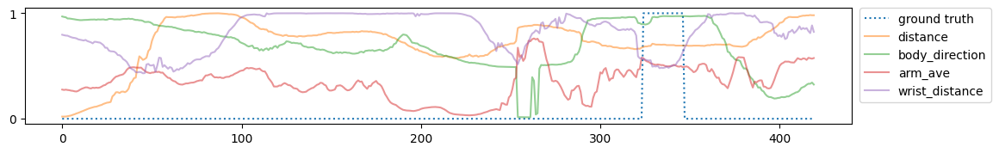

08_002_11_118_125


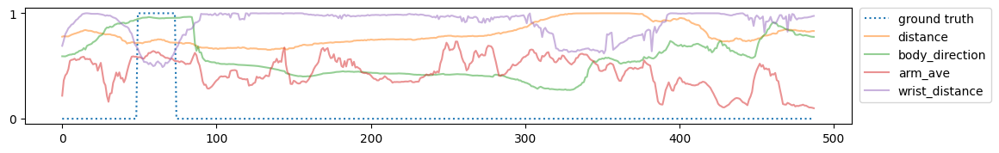

08_002_12_125_129


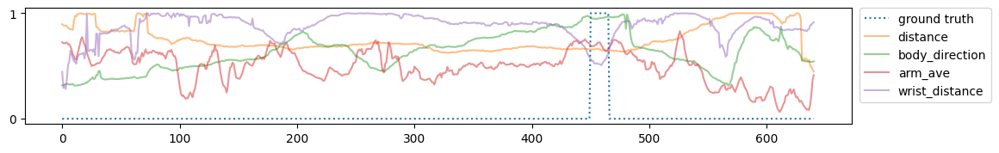

08_002_13_126_147


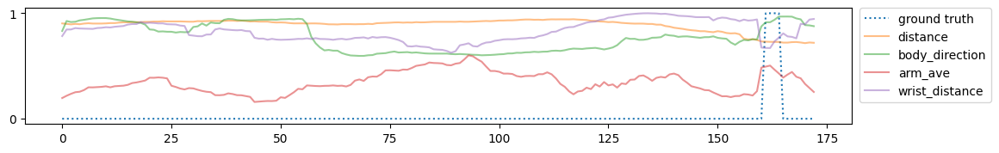

08_002_14_154_159


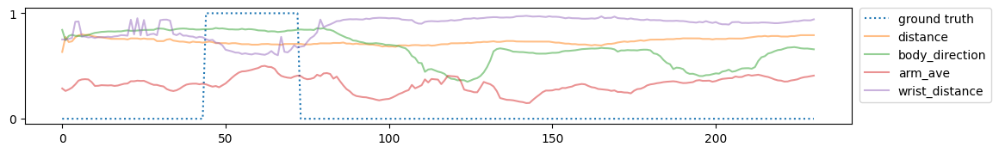

08_002_15_153_154


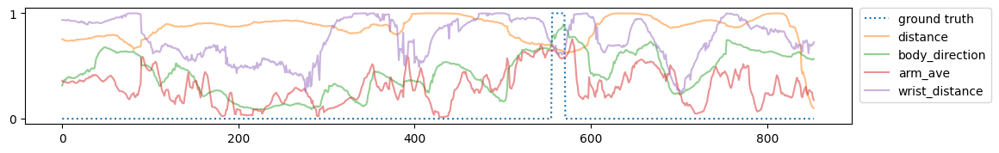

08_002_16_153_182


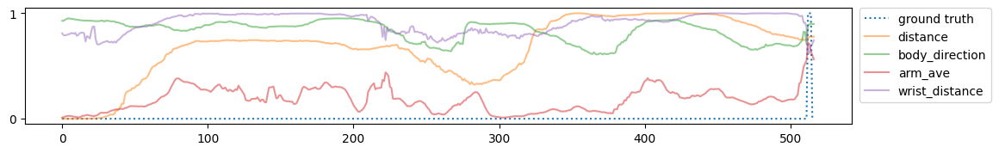

08_002_16_165_182


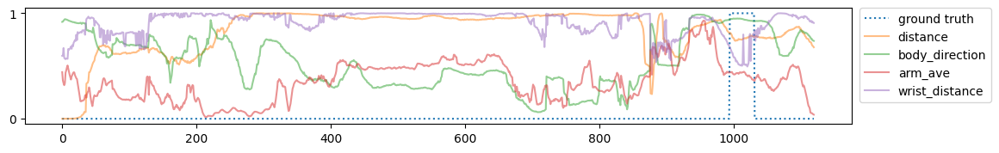

08_002_17_182_206


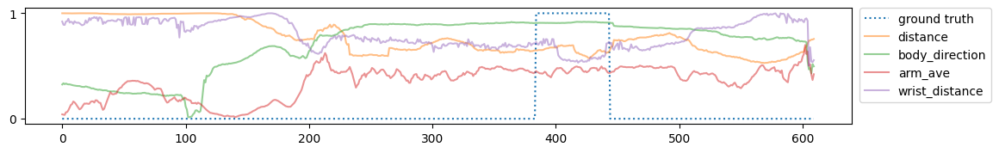

08_002_18_217_221


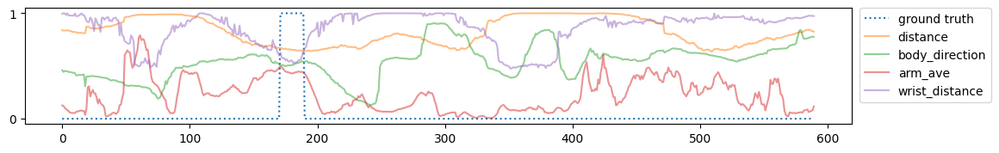

08_002_20_226_229


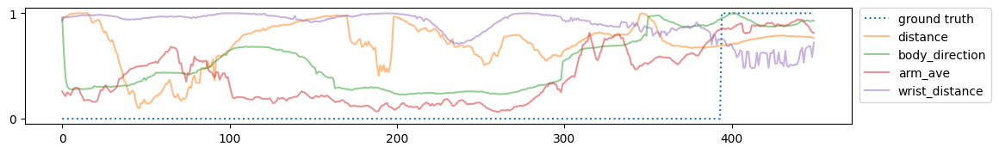

08_002_20_226_236


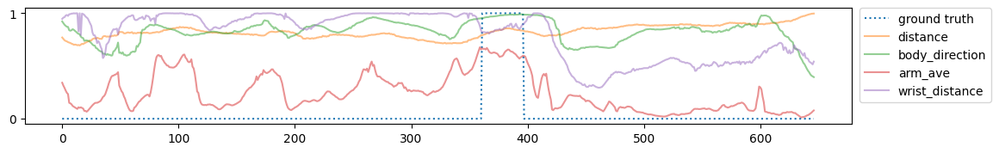

08_002_21_225_232


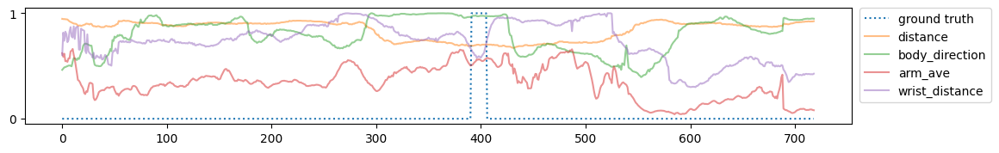

08_002_22_253_256


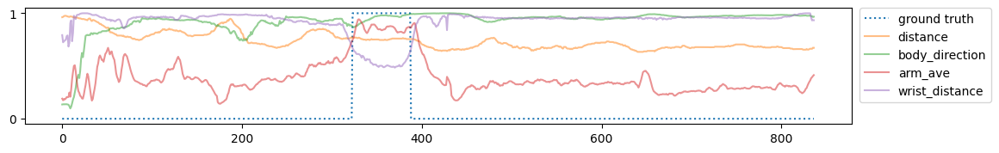

08_002_23_253_266


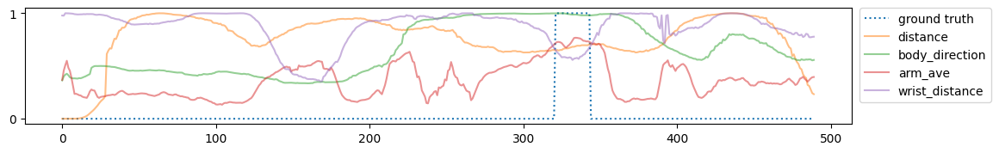

08_002_24_272_276


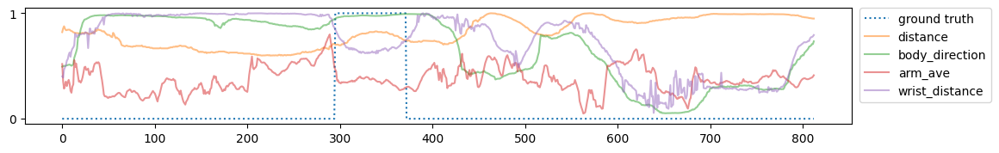

08_002_25_284_289


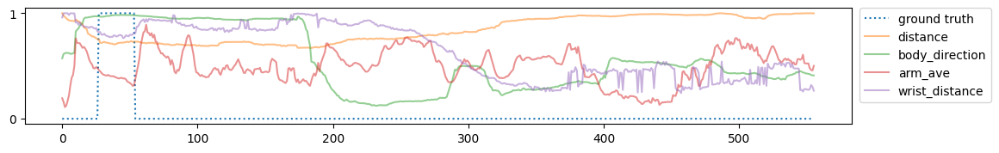

08_002_26_289_295


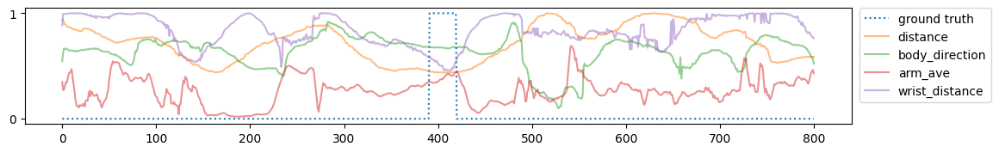

08_002_27_289_315


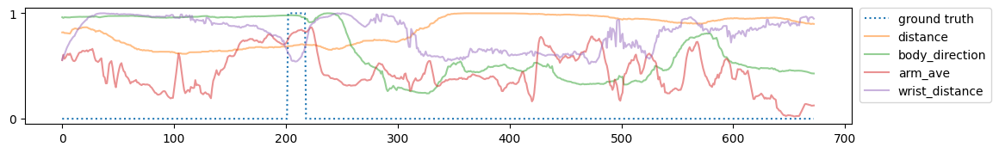

08_002_28_289_320


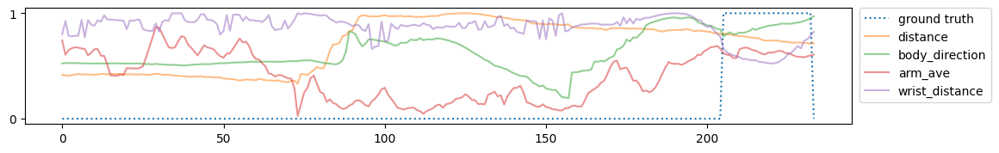

08_002_29_320_331


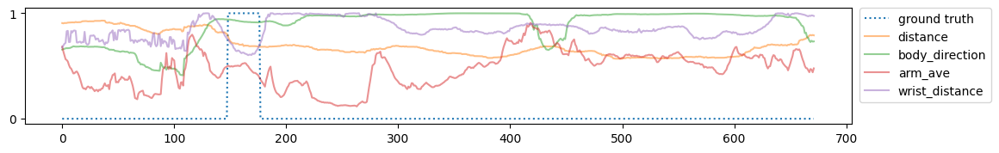

08_002_30_338_340


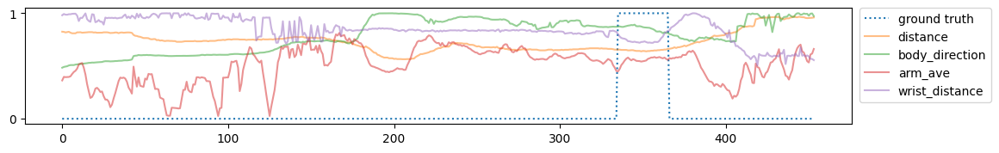

08_002_31_331_349


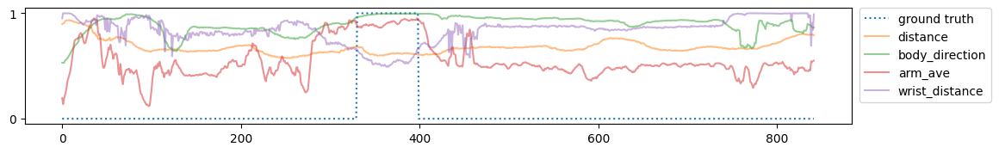

08_002_32_331_349


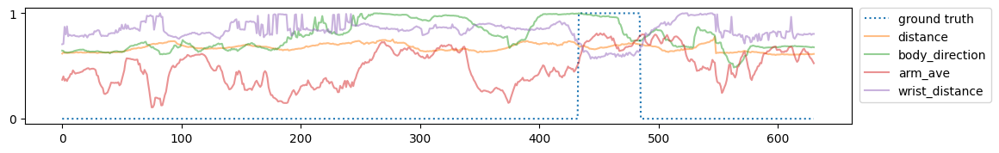

08_002_33_331_349


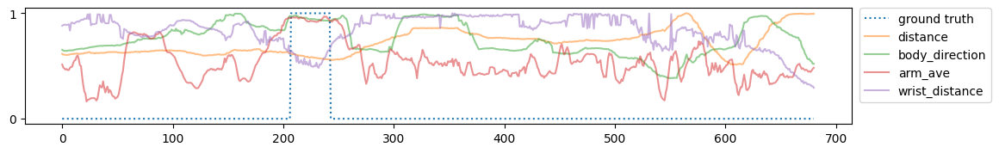

08_002_35_390_391


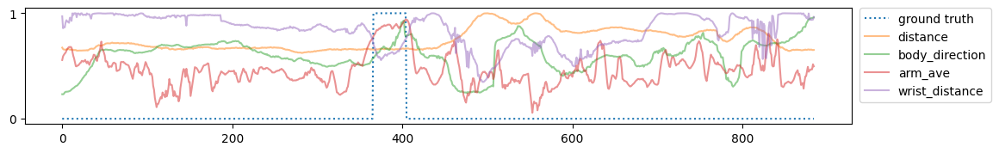

08_002_36_390_391


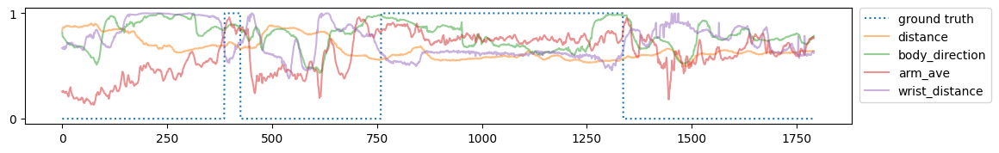

08_002_37_390_391


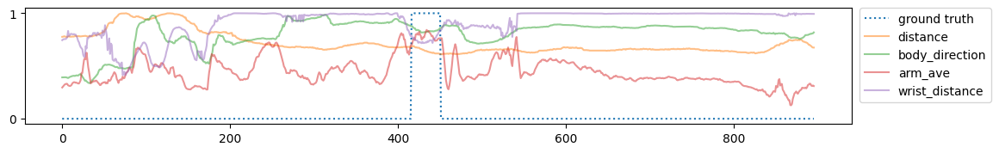

08_002_38_390_391


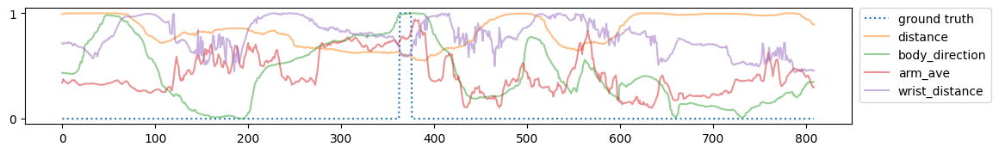

08_002_39_390_426


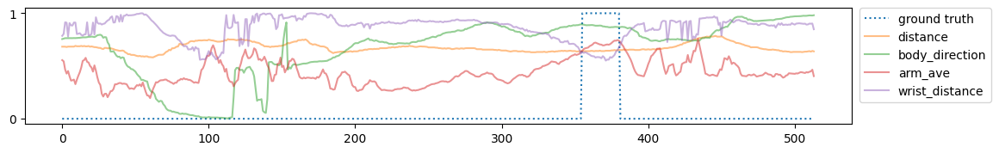

08_002_40_426_433


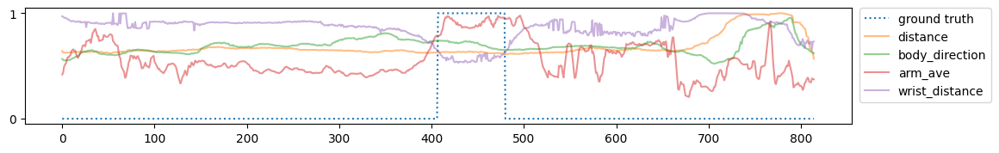

08_002_41_426_433


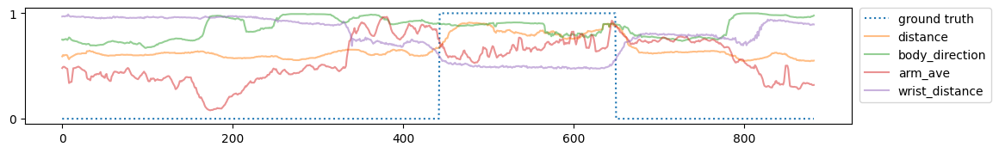

08_002_42_426_433


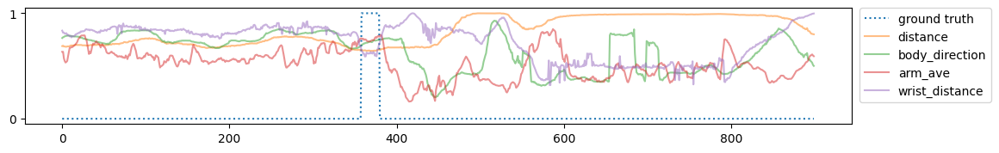

08_002_43_426_433


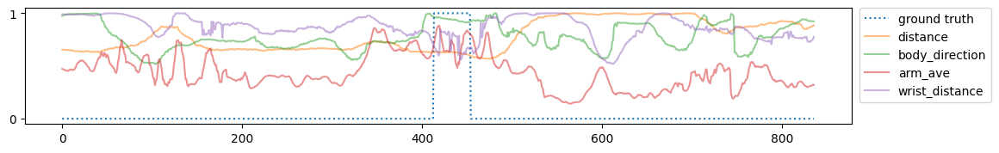

08_002_44_433_460


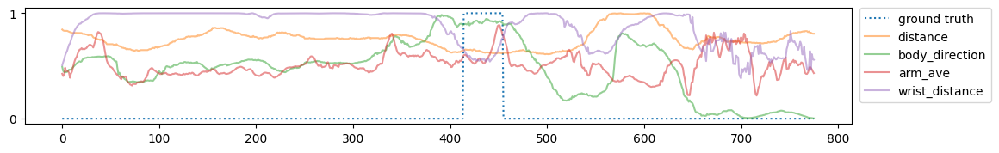

08_002_45_433_466


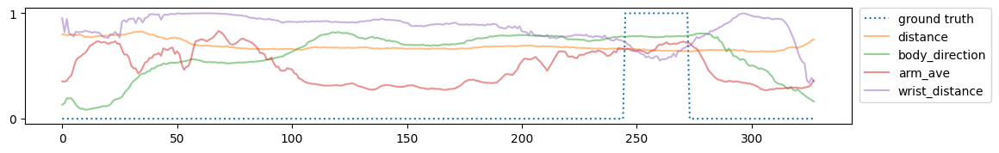

08_002_45_433_467


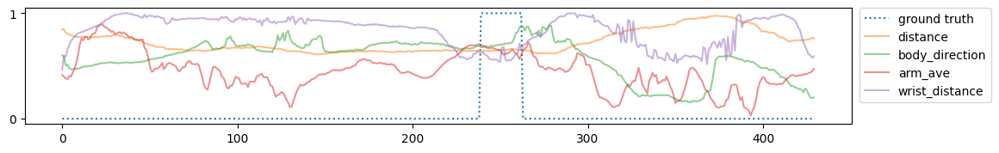

08_002_46_433_467


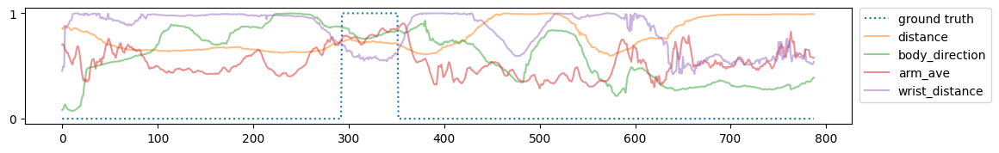

09_001_01_2_9


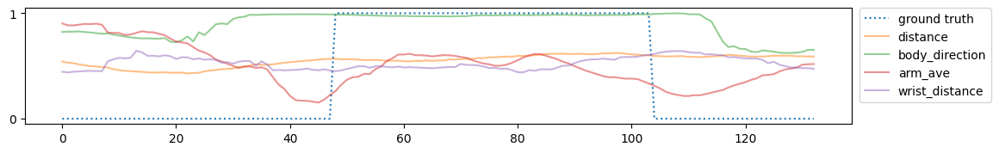

09_001_02_7_16


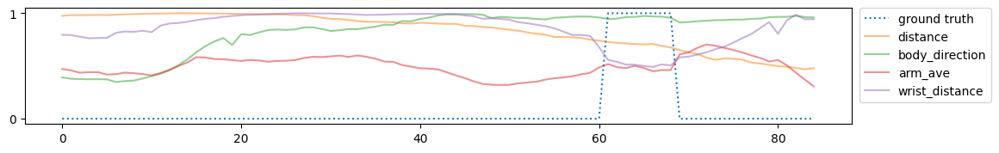

09_001_03_29_32


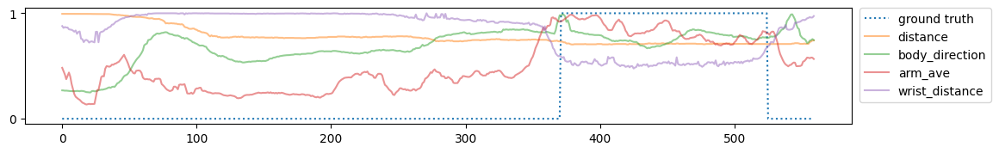

09_001_04_29_30


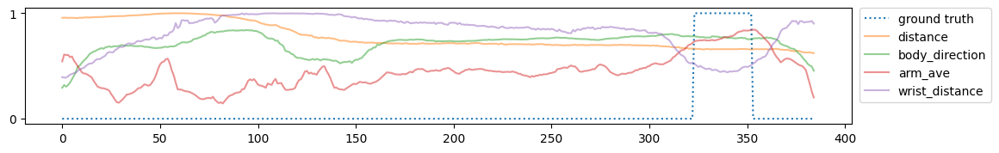

09_001_05_28_46


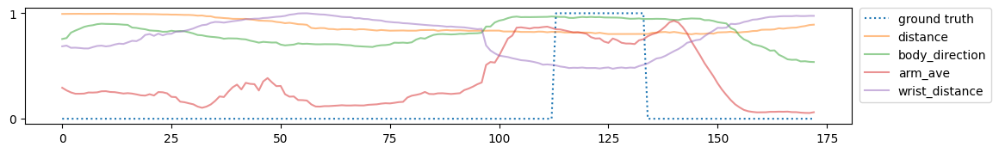

09_001_06_29_46


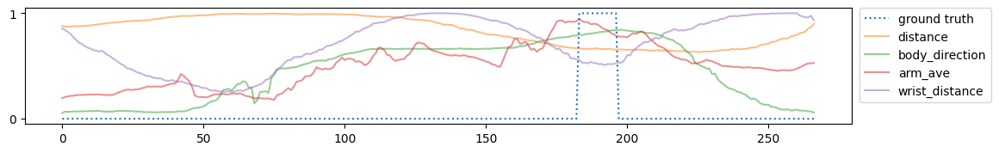

09_001_07_15_50


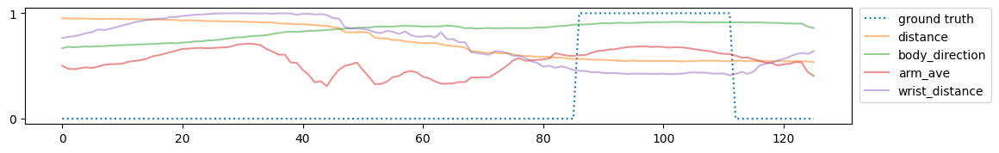

09_001_08_15_50


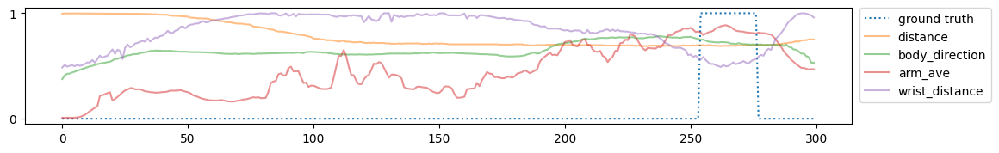

09_001_09_15_50


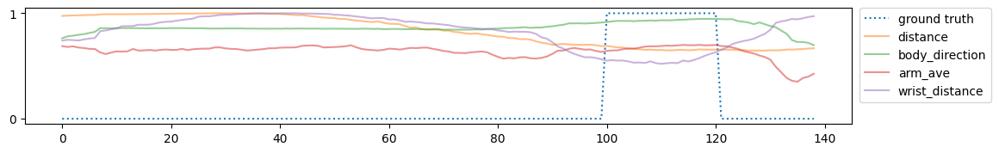

09_002_01_4_6


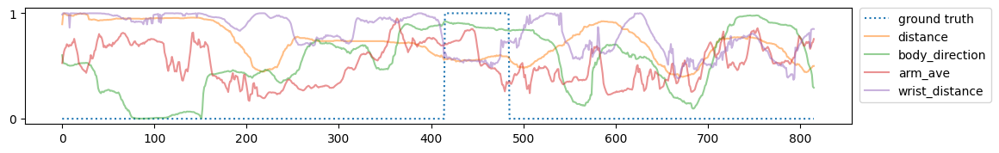

09_002_02_8_18


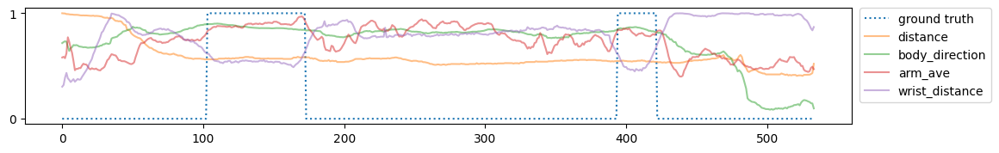

09_002_03_26_27


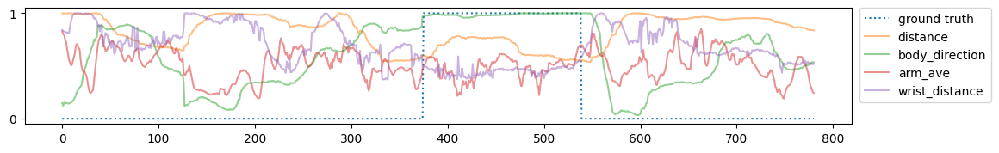

09_002_04_26_28


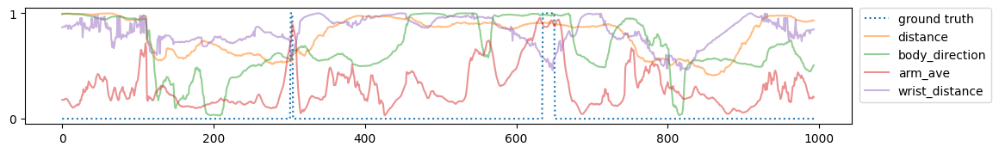

09_002_06_44_46


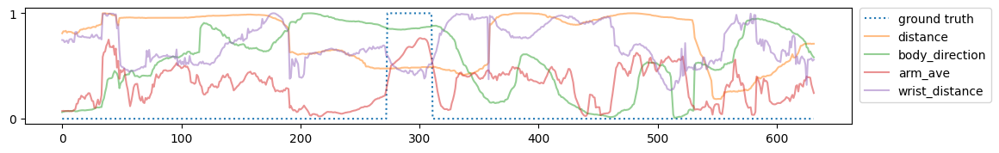

09_002_07_37_60


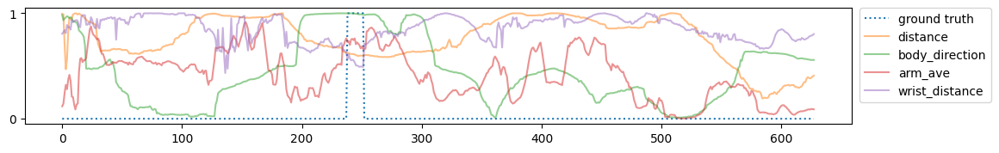

09_002_09_60_75


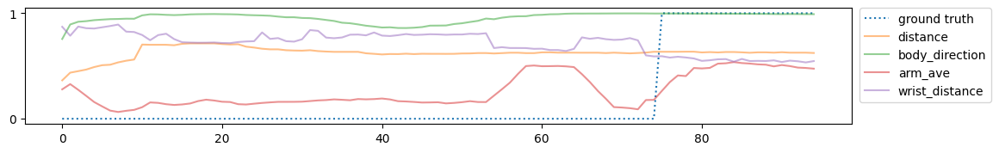

09_002_09_60_76


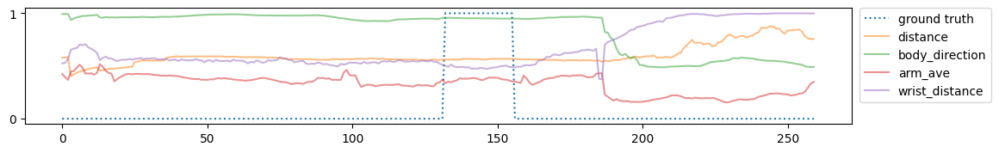

09_002_10_80_82


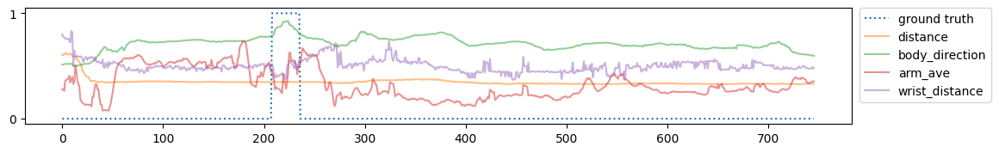

09_002_11_60_80


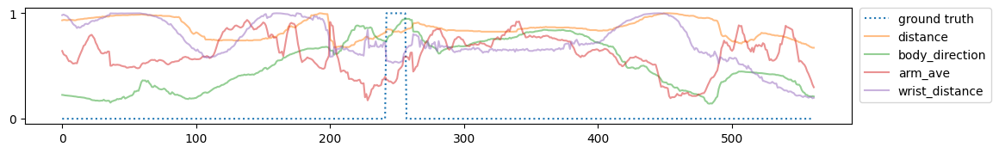

09_002_12_60_80


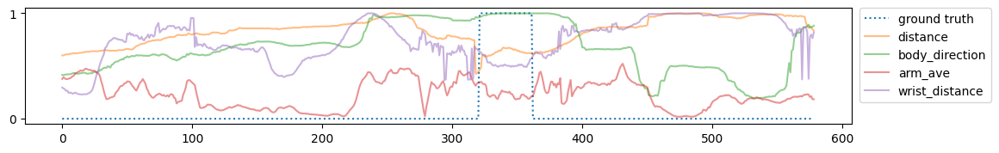

09_002_13_60_118


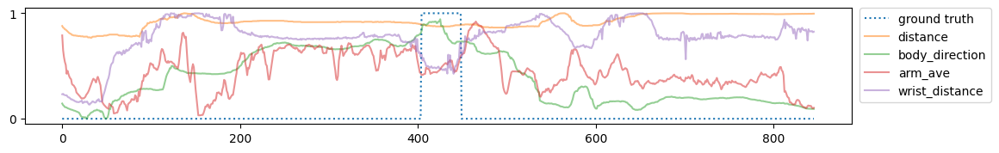

09_002_14_136_139


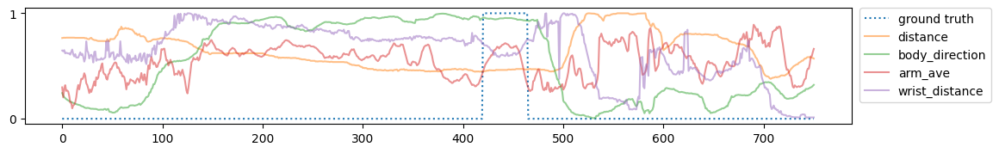

09_002_15_157_159


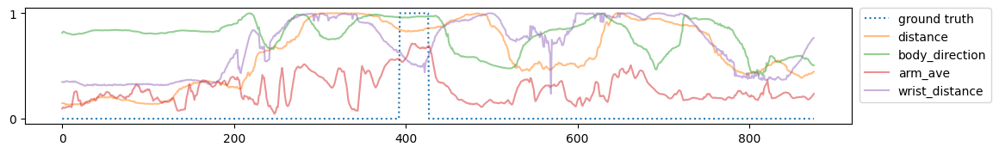

09_002_16_157_170


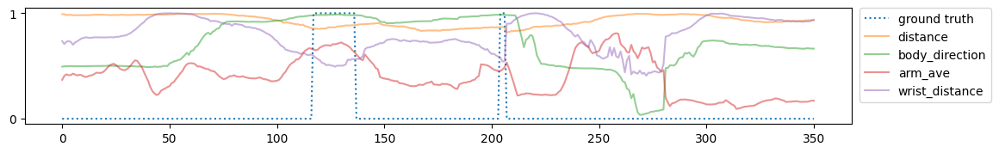

09_002_17_174_177


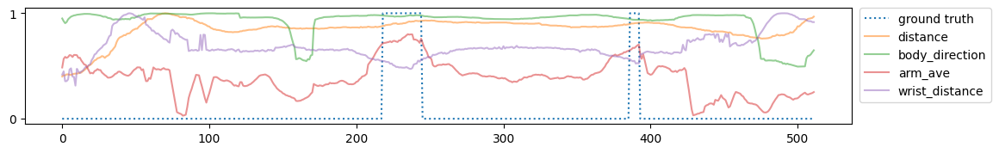

09_002_18_174_177


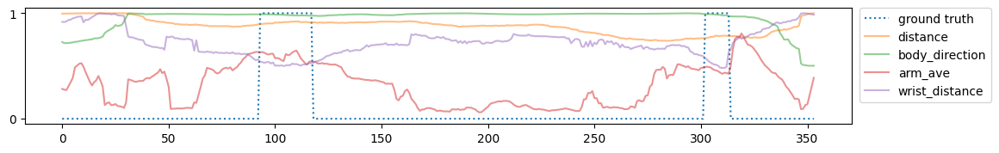

In [100]:
columns = ["distance", "body_direction", "arm_ave", "wrist_distance"]
for key in x_dict.keys():
    x_lst = np.array(x_dict[key])
    y_lst = y_dict[key]

    if 1 not in y_lst:
        continue

    if len(x_lst) < 30:
        continue

    print(key)
    plt.figure(figsize=(10, 1.5))
    # plt.rcParams["font.size"] = 20
    # plt.rcParams["font.family"] = 'Times New Roman'
    plt.plot(y_lst, linestyle=':', label='ground truth')
    for i, x in enumerate(x_lst.T[:4]):
        plt.plot(x, alpha=0.5, label=columns[i])
    plt.ylim((-0.05, 1.05))
    plt.yticks([0, 1])
    plt.legend(bbox_to_anchor=(1.01, 1), loc='upper left', borderaxespad=0)
    plt.subplots_adjust(left=0.04, right=1, bottom=0.1, top=1)

    plt.show()